*Twsha Vyas*

*22070126122*

*AIML B2*

# **Experiment 3**

**Objective:**
The goal of this assignment is to implement a Deep Convolutional Generative Adversarial Network (DCGAN) as described in the paper "Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks" by Radford et al. (2015).

You will train the model on either the LSUN Bedrooms dataset or the CelebA Faces dataset to generate realistic images.

# Training on the CelebA Faces dataset

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader, Dataset

# Importing Kaggle API to access datasets
import kagglehub
from kagglehub import KaggleDatasetAdapter

# Data handling and visualization libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

In [ ]:
# setting device to GPU if available for computation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Install dependencies if not already installed
!pip install kagglehub

In [ ]:
!mkdir -p ~/.kaggle  # Creating a directory for Kaggle API key
!echo '{"username":"twashavyassbtech2022","key":"4de7508742f6adc830fa54d4a69ec98e"}' > ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json  # Setting permissions for security

In [ ]:
!kaggle datasets download -d jessicali9530/celeba-dataset # Downloading the CelebA dataset

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 99% 1.32G/1.33G [00:09<00:00, 125MB/s]
100% 1.33G/1.33G [00:09<00:00, 152MB/s]


In [ ]:
!unzip -q celeba-dataset.zip -d celeba #unzipping celebA dataset downloaded in directory

In [ ]:
import os
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from PIL import Image

In [ ]:
data_dir = "celeba/img_align_celeba" # Accessing celebA dataset from unzipped directory

# Preprocessing steps

In [ ]:
# Image transformation steps for preprocessinf
transform = transforms.Compose([
    transforms.Resize((64, 64)),  # Resizinf all images to 64x64 to match DCGAN paper
    transforms.ToTensor(),  # Converting images to PyTorch tensor
    transforms.Normalize((0.5,), (0.5,))  # Normalizeing pixel value of images between -1 and 1 for stable training
])

In [ ]:
dataset = ImageFolder(root="celeba", transform=transform)
#  Creating a DataLoader for efficient batching
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=2)
# batch size of 128 is the number of images per batch
# shuffling is done to improve training performance
# using two threads for faster data loaing

In [ ]:
# Fetch a single batch of real images from the dataloader
real_batch = next(iter(dataloader))

In [ ]:
# Function to show 16 images
def show_images(images):
    img_grid = vutils.make_grid(images[:16], normalize=True)
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(img_grid.cpu(), (1,2,0)))
    plt.axis("off")
    plt.show()

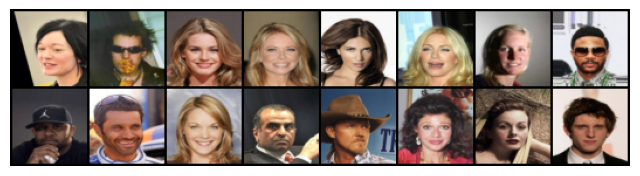

In [ ]:
# Getting a batch of real images and displaying it
real_batch = next(iter(dataloader))
show_images(real_batch[0])

# Defining DCGAN Architecture

Generator (G):

* Converts a latent noise vector (nz) into a 64×64 RGB image.
* Uses ConvTranspose2d to upsample progressively.
* BatchNorm2d ensures stable training.
* Tanh() normalizes output between [-1,1] for better GAN convergence.

Discriminator (D):

* Classifies images as real or fake.
* Uses Conv2d to downsample progressively.
* LeakyReLU(0.2) prevents dead neurons.
* Sigmoid() outputs a probability for real/fake classification.

In [ ]:
# Generator Model
class Generator(nn.Module):
    def __init__(self, nz, ngf, nc):
        """
        Parameters:
        - nz: Size of the latent vector (input noise)
        - ngf: Number of generator feature maps
        - nc: Number of output channels (e.g., 3 for RGB images)
        """
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)

# Discriminator Model
class Discriminator(nn.Module):
    def __init__(self, nc, ndf):
        """
        Parameters:
        - nc: Number of input channels (e.g., 3 for RGB images)
        - ndf: Number of discriminator feature maps
        """
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x)


In [ ]:
# Hyperparameters
nz = 100  # Size of latent vector (noise)
nc = 3    # Number of channels (RGB)
ngf = 64  # Generator feature maps
ndf = 64  # Discriminator feature maps
lr = 0.0002  # Learning rate
beta1 = 0.5  # Beta1 hyperparam for Adam optimizer

# Initialize models
netG = Generator(nz, ngf, nc).to(device)
netD = Discriminator(nc, ndf).to(device)

# Loss function
criterion = nn.BCELoss()

# Optimizers
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))

# Fixed noise for visualization
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

Epoch [0/50] Batch 0/1583 | D Loss: 1.4501 | G Loss: 3.1654
Epoch [0/50] Batch 100/1583 | D Loss: 0.4972 | G Loss: 4.9160
Epoch [0/50] Batch 200/1583 | D Loss: 2.1392 | G Loss: 6.5902
Epoch [0/50] Batch 300/1583 | D Loss: 0.7199 | G Loss: 3.5424
Epoch [0/50] Batch 400/1583 | D Loss: 1.0007 | G Loss: 5.4975
Epoch [0/50] Batch 500/1583 | D Loss: 1.3892 | G Loss: 3.7049
Epoch [0/50] Batch 600/1583 | D Loss: 0.5590 | G Loss: 2.1140
Epoch [0/50] Batch 700/1583 | D Loss: 0.5530 | G Loss: 1.8707
Epoch [0/50] Batch 800/1583 | D Loss: 0.6060 | G Loss: 1.3517
Epoch [0/50] Batch 900/1583 | D Loss: 0.6709 | G Loss: 2.0810
Epoch [0/50] Batch 1000/1583 | D Loss: 0.4543 | G Loss: 5.2989
Epoch [0/50] Batch 1100/1583 | D Loss: 0.4751 | G Loss: 2.8312
Epoch [0/50] Batch 1200/1583 | D Loss: 0.4051 | G Loss: 2.7713
Epoch [0/50] Batch 1300/1583 | D Loss: 0.5029 | G Loss: 4.4317
Epoch [0/50] Batch 1400/1583 | D Loss: 0.5738 | G Loss: 4.9589
Epoch [0/50] Batch 1500/1583 | D Loss: 0.3205 | G Loss: 3.4913


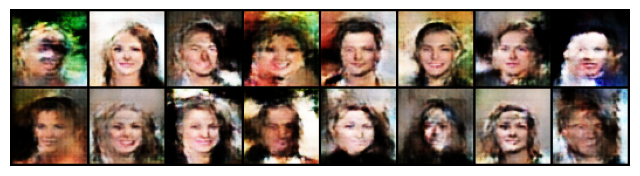

Epoch [1/50] Batch 0/1583 | D Loss: 0.7387 | G Loss: 1.9809
Epoch [1/50] Batch 100/1583 | D Loss: 0.7745 | G Loss: 5.3936
Epoch [1/50] Batch 200/1583 | D Loss: 0.8253 | G Loss: 2.3963
Epoch [1/50] Batch 300/1583 | D Loss: 0.4507 | G Loss: 4.3320
Epoch [1/50] Batch 400/1583 | D Loss: 0.8601 | G Loss: 2.7490
Epoch [1/50] Batch 500/1583 | D Loss: 0.2969 | G Loss: 3.1727
Epoch [1/50] Batch 600/1583 | D Loss: 0.2794 | G Loss: 3.5608
Epoch [1/50] Batch 700/1583 | D Loss: 0.5573 | G Loss: 2.0292
Epoch [1/50] Batch 800/1583 | D Loss: 0.4522 | G Loss: 2.2329
Epoch [1/50] Batch 900/1583 | D Loss: 1.2514 | G Loss: 0.6178
Epoch [1/50] Batch 1000/1583 | D Loss: 0.3235 | G Loss: 3.8164
Epoch [1/50] Batch 1100/1583 | D Loss: 0.7004 | G Loss: 2.9892
Epoch [1/50] Batch 1200/1583 | D Loss: 0.4863 | G Loss: 2.1881
Epoch [1/50] Batch 1300/1583 | D Loss: 0.3490 | G Loss: 3.2433
Epoch [1/50] Batch 1400/1583 | D Loss: 0.3913 | G Loss: 3.0788
Epoch [1/50] Batch 1500/1583 | D Loss: 0.4936 | G Loss: 2.4644


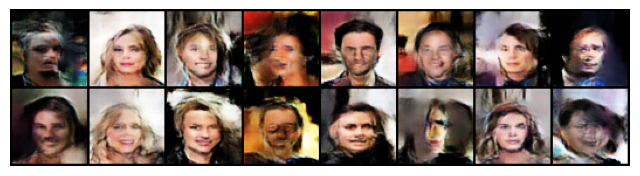

Epoch [2/50] Batch 0/1583 | D Loss: 1.3986 | G Loss: 9.2633
Epoch [2/50] Batch 100/1583 | D Loss: 0.1434 | G Loss: 3.7736
Epoch [2/50] Batch 200/1583 | D Loss: 0.4409 | G Loss: 1.3701
Epoch [2/50] Batch 300/1583 | D Loss: 0.3244 | G Loss: 2.2038
Epoch [2/50] Batch 400/1583 | D Loss: 0.1811 | G Loss: 3.8412
Epoch [2/50] Batch 500/1583 | D Loss: 0.6513 | G Loss: 4.0761
Epoch [2/50] Batch 600/1583 | D Loss: 0.5634 | G Loss: 2.8367
Epoch [2/50] Batch 700/1583 | D Loss: 0.4577 | G Loss: 4.5282
Epoch [2/50] Batch 800/1583 | D Loss: 1.6225 | G Loss: 0.2216
Epoch [2/50] Batch 900/1583 | D Loss: 0.4503 | G Loss: 4.6966
Epoch [2/50] Batch 1000/1583 | D Loss: 0.4870 | G Loss: 3.7439
Epoch [2/50] Batch 1100/1583 | D Loss: 2.2290 | G Loss: 7.4552
Epoch [2/50] Batch 1200/1583 | D Loss: 0.2194 | G Loss: 3.4405
Epoch [2/50] Batch 1300/1583 | D Loss: 0.2272 | G Loss: 3.7363
Epoch [2/50] Batch 1400/1583 | D Loss: 0.5091 | G Loss: 4.0895
Epoch [2/50] Batch 1500/1583 | D Loss: 0.3425 | G Loss: 3.6036


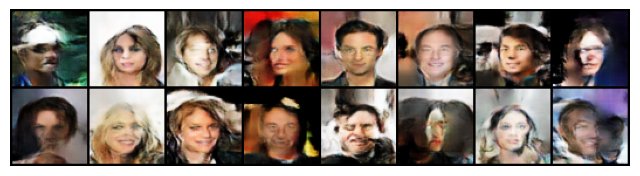

Epoch [3/50] Batch 0/1583 | D Loss: 0.2023 | G Loss: 5.2698
Epoch [3/50] Batch 100/1583 | D Loss: 0.1307 | G Loss: 4.2782
Epoch [3/50] Batch 200/1583 | D Loss: 0.2474 | G Loss: 3.2005
Epoch [3/50] Batch 300/1583 | D Loss: 0.3806 | G Loss: 2.7553
Epoch [3/50] Batch 400/1583 | D Loss: 0.4580 | G Loss: 2.9224
Epoch [3/50] Batch 500/1583 | D Loss: 0.2283 | G Loss: 3.6510
Epoch [3/50] Batch 600/1583 | D Loss: 0.4948 | G Loss: 3.4714
Epoch [3/50] Batch 700/1583 | D Loss: 0.2954 | G Loss: 2.0507
Epoch [3/50] Batch 800/1583 | D Loss: 0.3750 | G Loss: 3.3947
Epoch [3/50] Batch 900/1583 | D Loss: 0.1853 | G Loss: 3.3191
Epoch [3/50] Batch 1000/1583 | D Loss: 0.1858 | G Loss: 2.4925
Epoch [3/50] Batch 1100/1583 | D Loss: 0.3765 | G Loss: 1.8583
Epoch [3/50] Batch 1200/1583 | D Loss: 0.1068 | G Loss: 3.8387
Epoch [3/50] Batch 1300/1583 | D Loss: 1.0626 | G Loss: 1.1059
Epoch [3/50] Batch 1400/1583 | D Loss: 0.1774 | G Loss: 5.2476
Epoch [3/50] Batch 1500/1583 | D Loss: 0.5901 | G Loss: 7.4856


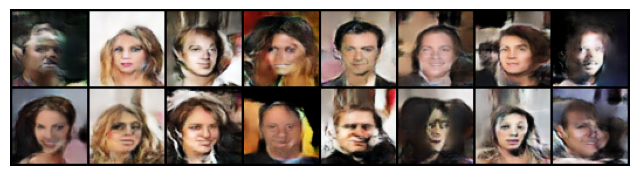

Epoch [4/50] Batch 0/1583 | D Loss: 0.0768 | G Loss: 4.2529
Epoch [4/50] Batch 100/1583 | D Loss: 0.4678 | G Loss: 1.8919
Epoch [4/50] Batch 200/1583 | D Loss: 0.3016 | G Loss: 3.7346
Epoch [4/50] Batch 300/1583 | D Loss: 0.1383 | G Loss: 3.2644
Epoch [4/50] Batch 400/1583 | D Loss: 0.3142 | G Loss: 3.9255
Epoch [4/50] Batch 500/1583 | D Loss: 0.2398 | G Loss: 4.2617
Epoch [4/50] Batch 600/1583 | D Loss: 0.1766 | G Loss: 3.1202
Epoch [4/50] Batch 700/1583 | D Loss: 0.2536 | G Loss: 4.3489
Epoch [4/50] Batch 800/1583 | D Loss: 0.1357 | G Loss: 4.3737
Epoch [4/50] Batch 900/1583 | D Loss: 0.4529 | G Loss: 4.2835
Epoch [4/50] Batch 1000/1583 | D Loss: 0.1336 | G Loss: 4.3308
Epoch [4/50] Batch 1100/1583 | D Loss: 0.1025 | G Loss: 4.4164
Epoch [4/50] Batch 1200/1583 | D Loss: 0.8143 | G Loss: 6.8671
Epoch [4/50] Batch 1300/1583 | D Loss: 0.2104 | G Loss: 3.4811
Epoch [4/50] Batch 1400/1583 | D Loss: 0.2081 | G Loss: 2.9017
Epoch [4/50] Batch 1500/1583 | D Loss: 0.3189 | G Loss: 3.6486


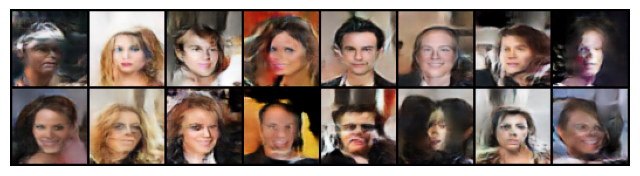

Epoch [5/50] Batch 0/1583 | D Loss: 0.1231 | G Loss: 4.2681
Epoch [5/50] Batch 100/1583 | D Loss: 0.0937 | G Loss: 4.1720
Epoch [5/50] Batch 200/1583 | D Loss: 0.2181 | G Loss: 3.8019
Epoch [5/50] Batch 300/1583 | D Loss: 0.9713 | G Loss: 2.6764
Epoch [5/50] Batch 400/1583 | D Loss: 0.3758 | G Loss: 3.9686
Epoch [5/50] Batch 500/1583 | D Loss: 0.1669 | G Loss: 4.3088
Epoch [5/50] Batch 600/1583 | D Loss: 0.2604 | G Loss: 2.7335
Epoch [5/50] Batch 700/1583 | D Loss: 0.1779 | G Loss: 4.8882
Epoch [5/50] Batch 800/1583 | D Loss: 0.2130 | G Loss: 5.1347
Epoch [5/50] Batch 900/1583 | D Loss: 2.0908 | G Loss: 0.2109
Epoch [5/50] Batch 1000/1583 | D Loss: 0.6489 | G Loss: 1.5375
Epoch [5/50] Batch 1100/1583 | D Loss: 0.4061 | G Loss: 3.6163
Epoch [5/50] Batch 1200/1583 | D Loss: 0.4092 | G Loss: 3.3783
Epoch [5/50] Batch 1300/1583 | D Loss: 0.1567 | G Loss: 4.4463
Epoch [5/50] Batch 1400/1583 | D Loss: 0.3815 | G Loss: 1.8293
Epoch [5/50] Batch 1500/1583 | D Loss: 0.1100 | G Loss: 4.8715


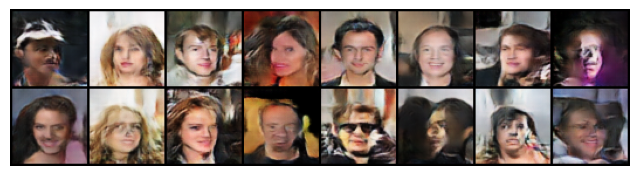

Epoch [6/50] Batch 0/1583 | D Loss: 0.1070 | G Loss: 4.0926
Epoch [6/50] Batch 100/1583 | D Loss: 0.2718 | G Loss: 2.6632
Epoch [6/50] Batch 200/1583 | D Loss: 0.2494 | G Loss: 3.6743
Epoch [6/50] Batch 300/1583 | D Loss: 0.1076 | G Loss: 3.8021
Epoch [6/50] Batch 400/1583 | D Loss: 0.3353 | G Loss: 5.5888
Epoch [6/50] Batch 500/1583 | D Loss: 0.3712 | G Loss: 3.0340
Epoch [6/50] Batch 600/1583 | D Loss: 0.2835 | G Loss: 3.9734
Epoch [6/50] Batch 700/1583 | D Loss: 0.1273 | G Loss: 4.0714
Epoch [6/50] Batch 800/1583 | D Loss: 0.0920 | G Loss: 4.1843
Epoch [6/50] Batch 900/1583 | D Loss: 0.1162 | G Loss: 4.4170
Epoch [6/50] Batch 1000/1583 | D Loss: 0.3983 | G Loss: 1.6778
Epoch [6/50] Batch 1100/1583 | D Loss: 0.3813 | G Loss: 4.1219
Epoch [6/50] Batch 1200/1583 | D Loss: 0.6421 | G Loss: 2.9343
Epoch [6/50] Batch 1300/1583 | D Loss: 0.1131 | G Loss: 3.7712
Epoch [6/50] Batch 1400/1583 | D Loss: 0.3674 | G Loss: 5.0539
Epoch [6/50] Batch 1500/1583 | D Loss: 0.3581 | G Loss: 2.3979


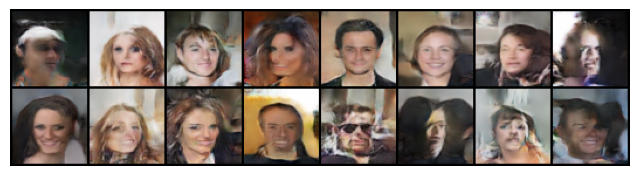

Epoch [7/50] Batch 0/1583 | D Loss: 0.0914 | G Loss: 4.6434
Epoch [7/50] Batch 100/1583 | D Loss: 0.0963 | G Loss: 4.0527
Epoch [7/50] Batch 200/1583 | D Loss: 0.3857 | G Loss: 3.8510
Epoch [7/50] Batch 300/1583 | D Loss: 0.9303 | G Loss: 1.5757
Epoch [7/50] Batch 400/1583 | D Loss: 0.2664 | G Loss: 3.2218
Epoch [7/50] Batch 500/1583 | D Loss: 0.1157 | G Loss: 5.0588
Epoch [7/50] Batch 600/1583 | D Loss: 0.2198 | G Loss: 4.8258
Epoch [7/50] Batch 700/1583 | D Loss: 0.0638 | G Loss: 4.3540
Epoch [7/50] Batch 800/1583 | D Loss: 1.2668 | G Loss: 8.1871
Epoch [7/50] Batch 900/1583 | D Loss: 0.2324 | G Loss: 3.2856
Epoch [7/50] Batch 1000/1583 | D Loss: 0.0928 | G Loss: 4.7614
Epoch [7/50] Batch 1100/1583 | D Loss: 0.1084 | G Loss: 4.9444
Epoch [7/50] Batch 1200/1583 | D Loss: 0.3129 | G Loss: 4.8628
Epoch [7/50] Batch 1300/1583 | D Loss: 0.1804 | G Loss: 3.8826
Epoch [7/50] Batch 1400/1583 | D Loss: 0.0704 | G Loss: 4.7527
Epoch [7/50] Batch 1500/1583 | D Loss: 0.8265 | G Loss: 3.1147


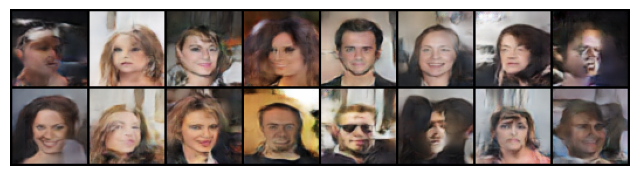

Epoch [8/50] Batch 0/1583 | D Loss: 0.0812 | G Loss: 4.2229
Epoch [8/50] Batch 100/1583 | D Loss: 0.3241 | G Loss: 8.9192
Epoch [8/50] Batch 200/1583 | D Loss: 0.2177 | G Loss: 3.5503
Epoch [8/50] Batch 300/1583 | D Loss: 0.3188 | G Loss: 6.0350
Epoch [8/50] Batch 400/1583 | D Loss: 0.1567 | G Loss: 3.4353
Epoch [8/50] Batch 500/1583 | D Loss: 1.0548 | G Loss: 3.8709
Epoch [8/50] Batch 600/1583 | D Loss: 1.0022 | G Loss: 0.7015
Epoch [8/50] Batch 700/1583 | D Loss: 0.0738 | G Loss: 3.5106
Epoch [8/50] Batch 800/1583 | D Loss: 0.1057 | G Loss: 3.8003
Epoch [8/50] Batch 900/1583 | D Loss: 0.6579 | G Loss: 5.0336
Epoch [8/50] Batch 1000/1583 | D Loss: 0.0997 | G Loss: 4.1409
Epoch [8/50] Batch 1100/1583 | D Loss: 0.0673 | G Loss: 4.4802
Epoch [8/50] Batch 1200/1583 | D Loss: 0.1638 | G Loss: 5.9907
Epoch [8/50] Batch 1300/1583 | D Loss: 0.3584 | G Loss: 5.6955
Epoch [8/50] Batch 1400/1583 | D Loss: 0.0671 | G Loss: 4.2215
Epoch [8/50] Batch 1500/1583 | D Loss: 0.0767 | G Loss: 3.8916


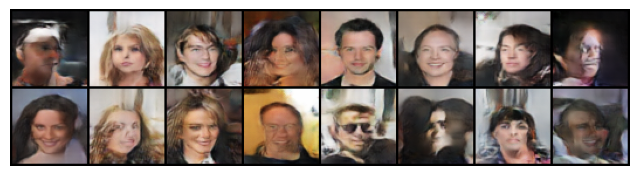

Epoch [9/50] Batch 0/1583 | D Loss: 0.5712 | G Loss: 2.9353
Epoch [9/50] Batch 100/1583 | D Loss: 0.2075 | G Loss: 4.1589
Epoch [9/50] Batch 200/1583 | D Loss: 0.0584 | G Loss: 5.0175
Epoch [9/50] Batch 300/1583 | D Loss: 0.1240 | G Loss: 5.2594
Epoch [9/50] Batch 400/1583 | D Loss: 0.0904 | G Loss: 4.1059
Epoch [9/50] Batch 500/1583 | D Loss: 0.0969 | G Loss: 4.1206
Epoch [9/50] Batch 600/1583 | D Loss: 4.4031 | G Loss: 6.1972
Epoch [9/50] Batch 700/1583 | D Loss: 0.1062 | G Loss: 4.3662
Epoch [9/50] Batch 800/1583 | D Loss: 0.1761 | G Loss: 4.2750
Epoch [9/50] Batch 900/1583 | D Loss: 1.4416 | G Loss: 11.2634
Epoch [9/50] Batch 1000/1583 | D Loss: 5.4695 | G Loss: 0.1757
Epoch [9/50] Batch 1100/1583 | D Loss: 0.9368 | G Loss: 4.7131
Epoch [9/50] Batch 1200/1583 | D Loss: 0.1006 | G Loss: 3.7486
Epoch [9/50] Batch 1300/1583 | D Loss: 0.0881 | G Loss: 4.6758
Epoch [9/50] Batch 1400/1583 | D Loss: 0.1007 | G Loss: 4.3366
Epoch [9/50] Batch 1500/1583 | D Loss: 0.3958 | G Loss: 2.7885


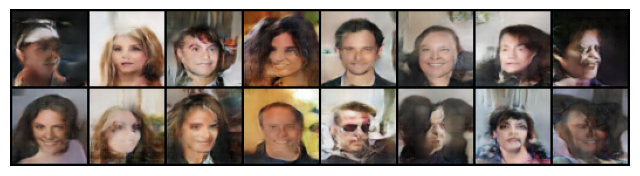

Epoch [10/50] Batch 0/1583 | D Loss: 0.5859 | G Loss: 4.2166
Epoch [10/50] Batch 100/1583 | D Loss: 0.3466 | G Loss: 6.0742
Epoch [10/50] Batch 200/1583 | D Loss: 0.0938 | G Loss: 4.8609
Epoch [10/50] Batch 300/1583 | D Loss: 0.2040 | G Loss: 3.7755
Epoch [10/50] Batch 400/1583 | D Loss: 0.0653 | G Loss: 3.9296
Epoch [10/50] Batch 500/1583 | D Loss: 0.3189 | G Loss: 8.0761
Epoch [10/50] Batch 600/1583 | D Loss: 0.5256 | G Loss: 4.7437
Epoch [10/50] Batch 700/1583 | D Loss: 0.1193 | G Loss: 4.3832
Epoch [10/50] Batch 800/1583 | D Loss: 0.0875 | G Loss: 4.2265
Epoch [10/50] Batch 900/1583 | D Loss: 0.0617 | G Loss: 4.9510
Epoch [10/50] Batch 1000/1583 | D Loss: 0.0605 | G Loss: 4.4970
Epoch [10/50] Batch 1100/1583 | D Loss: 0.0372 | G Loss: 5.2464
Epoch [10/50] Batch 1200/1583 | D Loss: 0.3020 | G Loss: 6.0710
Epoch [10/50] Batch 1300/1583 | D Loss: 0.6128 | G Loss: 4.2578
Epoch [10/50] Batch 1400/1583 | D Loss: 0.0879 | G Loss: 4.0244
Epoch [10/50] Batch 1500/1583 | D Loss: 0.8458 | G L

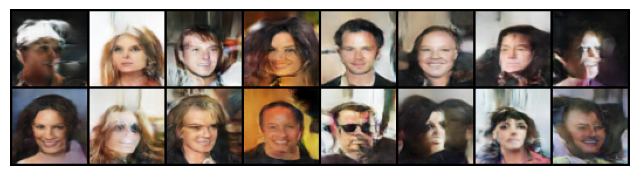

Epoch [11/50] Batch 0/1583 | D Loss: 0.2866 | G Loss: 7.5952
Epoch [11/50] Batch 100/1583 | D Loss: 0.1676 | G Loss: 4.0257
Epoch [11/50] Batch 200/1583 | D Loss: 0.0996 | G Loss: 4.9901
Epoch [11/50] Batch 300/1583 | D Loss: 0.0441 | G Loss: 4.5858
Epoch [11/50] Batch 400/1583 | D Loss: 0.1392 | G Loss: 4.5250
Epoch [11/50] Batch 500/1583 | D Loss: 0.3061 | G Loss: 3.4228
Epoch [11/50] Batch 600/1583 | D Loss: 0.1255 | G Loss: 6.0120
Epoch [11/50] Batch 700/1583 | D Loss: 0.2749 | G Loss: 3.9397
Epoch [11/50] Batch 800/1583 | D Loss: 0.7457 | G Loss: 1.3196
Epoch [11/50] Batch 900/1583 | D Loss: 0.2143 | G Loss: 4.9699
Epoch [11/50] Batch 1000/1583 | D Loss: 0.3955 | G Loss: 4.5593
Epoch [11/50] Batch 1100/1583 | D Loss: 0.3124 | G Loss: 7.7804
Epoch [11/50] Batch 1200/1583 | D Loss: 0.0769 | G Loss: 4.6093
Epoch [11/50] Batch 1300/1583 | D Loss: 0.6938 | G Loss: 0.8466
Epoch [11/50] Batch 1400/1583 | D Loss: 0.0476 | G Loss: 5.1390
Epoch [11/50] Batch 1500/1583 | D Loss: 0.0112 | G L

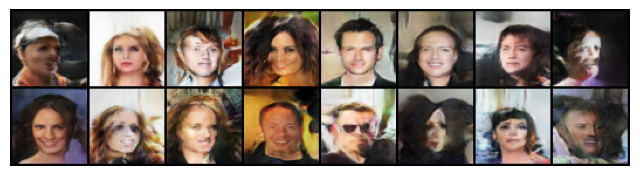

Epoch [12/50] Batch 0/1583 | D Loss: 0.3218 | G Loss: 3.2817
Epoch [12/50] Batch 100/1583 | D Loss: 0.7264 | G Loss: 1.6017
Epoch [12/50] Batch 200/1583 | D Loss: 0.4816 | G Loss: 1.4203
Epoch [12/50] Batch 300/1583 | D Loss: 0.1076 | G Loss: 4.7818
Epoch [12/50] Batch 400/1583 | D Loss: 0.0940 | G Loss: 5.4738
Epoch [12/50] Batch 500/1583 | D Loss: 0.6761 | G Loss: 3.0217
Epoch [12/50] Batch 600/1583 | D Loss: 0.0910 | G Loss: 5.1149
Epoch [12/50] Batch 700/1583 | D Loss: 0.2599 | G Loss: 2.4956
Epoch [12/50] Batch 800/1583 | D Loss: 0.0447 | G Loss: 4.8442
Epoch [12/50] Batch 900/1583 | D Loss: 0.2098 | G Loss: 4.7362
Epoch [12/50] Batch 1000/1583 | D Loss: 0.6075 | G Loss: 2.5096
Epoch [12/50] Batch 1100/1583 | D Loss: 0.0743 | G Loss: 4.0616
Epoch [12/50] Batch 1200/1583 | D Loss: 0.1088 | G Loss: 4.1340
Epoch [12/50] Batch 1300/1583 | D Loss: 0.0560 | G Loss: 4.9649
Epoch [12/50] Batch 1400/1583 | D Loss: 0.1310 | G Loss: 4.1870
Epoch [12/50] Batch 1500/1583 | D Loss: 0.6933 | G L

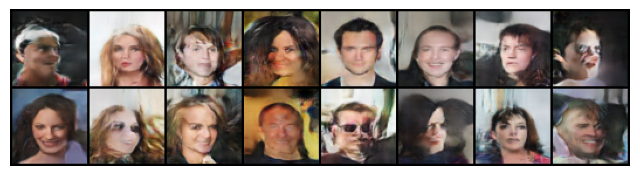

Epoch [13/50] Batch 0/1583 | D Loss: 0.1235 | G Loss: 4.0295
Epoch [13/50] Batch 100/1583 | D Loss: 0.0870 | G Loss: 4.1030
Epoch [13/50] Batch 200/1583 | D Loss: 0.8312 | G Loss: 4.8968
Epoch [13/50] Batch 300/1583 | D Loss: 0.0408 | G Loss: 5.4651
Epoch [13/50] Batch 400/1583 | D Loss: 0.0775 | G Loss: 4.6722
Epoch [13/50] Batch 500/1583 | D Loss: 0.1202 | G Loss: 2.9657
Epoch [13/50] Batch 600/1583 | D Loss: 0.0402 | G Loss: 5.2295
Epoch [13/50] Batch 700/1583 | D Loss: 0.1286 | G Loss: 3.6461
Epoch [13/50] Batch 800/1583 | D Loss: 0.0871 | G Loss: 4.2643
Epoch [13/50] Batch 900/1583 | D Loss: 0.0538 | G Loss: 4.4515
Epoch [13/50] Batch 1000/1583 | D Loss: 1.7379 | G Loss: 5.6526
Epoch [13/50] Batch 1100/1583 | D Loss: 0.0744 | G Loss: 4.7260
Epoch [13/50] Batch 1200/1583 | D Loss: 0.3074 | G Loss: 3.2909
Epoch [13/50] Batch 1300/1583 | D Loss: 0.1021 | G Loss: 6.4090
Epoch [13/50] Batch 1400/1583 | D Loss: 0.5156 | G Loss: 3.5447
Epoch [13/50] Batch 1500/1583 | D Loss: 0.1269 | G L

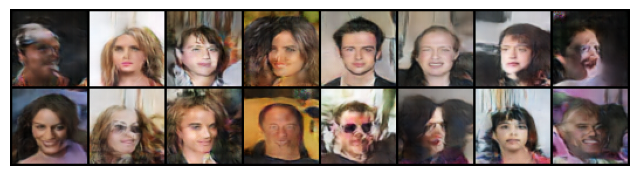

Epoch [14/50] Batch 0/1583 | D Loss: 0.0974 | G Loss: 5.4853
Epoch [14/50] Batch 100/1583 | D Loss: 0.0615 | G Loss: 4.7721
Epoch [14/50] Batch 200/1583 | D Loss: 0.0816 | G Loss: 5.9499
Epoch [14/50] Batch 300/1583 | D Loss: 0.1932 | G Loss: 5.5592
Epoch [14/50] Batch 400/1583 | D Loss: 0.0688 | G Loss: 4.5682
Epoch [14/50] Batch 500/1583 | D Loss: 1.1282 | G Loss: 0.3885
Epoch [14/50] Batch 600/1583 | D Loss: 0.0794 | G Loss: 5.2801
Epoch [14/50] Batch 700/1583 | D Loss: 0.1290 | G Loss: 4.4638
Epoch [14/50] Batch 800/1583 | D Loss: 0.1751 | G Loss: 3.5632
Epoch [14/50] Batch 900/1583 | D Loss: 0.0469 | G Loss: 4.8239
Epoch [14/50] Batch 1000/1583 | D Loss: 0.0375 | G Loss: 5.6183
Epoch [14/50] Batch 1100/1583 | D Loss: 0.0384 | G Loss: 5.7104
Epoch [14/50] Batch 1200/1583 | D Loss: 0.1236 | G Loss: 5.1184
Epoch [14/50] Batch 1300/1583 | D Loss: 0.4013 | G Loss: 2.5148
Epoch [14/50] Batch 1400/1583 | D Loss: 1.6487 | G Loss: 1.7612
Epoch [14/50] Batch 1500/1583 | D Loss: 0.0926 | G L

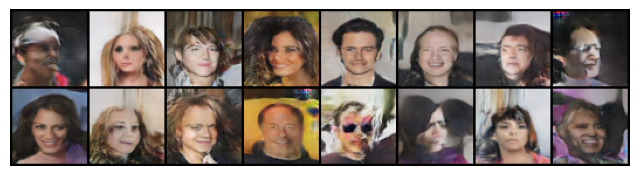

Epoch [15/50] Batch 0/1583 | D Loss: 0.0115 | G Loss: 4.9051
Epoch [15/50] Batch 100/1583 | D Loss: 0.0483 | G Loss: 6.2353
Epoch [15/50] Batch 200/1583 | D Loss: 0.0831 | G Loss: 4.7970
Epoch [15/50] Batch 300/1583 | D Loss: 0.2704 | G Loss: 4.4192
Epoch [15/50] Batch 400/1583 | D Loss: 0.1387 | G Loss: 4.1636
Epoch [15/50] Batch 500/1583 | D Loss: 0.0662 | G Loss: 5.0457
Epoch [15/50] Batch 600/1583 | D Loss: 0.1585 | G Loss: 7.1071
Epoch [15/50] Batch 700/1583 | D Loss: 0.2965 | G Loss: 8.1208
Epoch [15/50] Batch 800/1583 | D Loss: 0.0415 | G Loss: 5.2638
Epoch [15/50] Batch 900/1583 | D Loss: 0.9630 | G Loss: 3.5970
Epoch [15/50] Batch 1000/1583 | D Loss: 0.6273 | G Loss: 1.2242
Epoch [15/50] Batch 1100/1583 | D Loss: 0.1962 | G Loss: 3.3554
Epoch [15/50] Batch 1200/1583 | D Loss: 0.4447 | G Loss: 3.5271
Epoch [15/50] Batch 1300/1583 | D Loss: 0.0585 | G Loss: 5.7409
Epoch [15/50] Batch 1400/1583 | D Loss: 0.1329 | G Loss: 4.8749
Epoch [15/50] Batch 1500/1583 | D Loss: 0.2823 | G L

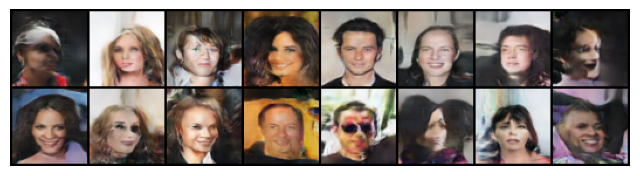

Epoch [16/50] Batch 0/1583 | D Loss: 0.0368 | G Loss: 5.1288
Epoch [16/50] Batch 100/1583 | D Loss: 0.0474 | G Loss: 5.3416
Epoch [16/50] Batch 200/1583 | D Loss: 0.0690 | G Loss: 4.5327
Epoch [16/50] Batch 300/1583 | D Loss: 0.0345 | G Loss: 5.2251
Epoch [16/50] Batch 400/1583 | D Loss: 0.0673 | G Loss: 5.3754
Epoch [16/50] Batch 500/1583 | D Loss: 0.0366 | G Loss: 5.3410
Epoch [16/50] Batch 600/1583 | D Loss: 0.0353 | G Loss: 5.8832
Epoch [16/50] Batch 700/1583 | D Loss: 0.0462 | G Loss: 4.6118
Epoch [16/50] Batch 800/1583 | D Loss: 0.2921 | G Loss: 3.7259
Epoch [16/50] Batch 900/1583 | D Loss: 0.7681 | G Loss: 10.0494
Epoch [16/50] Batch 1000/1583 | D Loss: 0.1157 | G Loss: 5.6456
Epoch [16/50] Batch 1100/1583 | D Loss: 0.2780 | G Loss: 3.9871
Epoch [16/50] Batch 1200/1583 | D Loss: 0.0767 | G Loss: 5.1873
Epoch [16/50] Batch 1300/1583 | D Loss: 0.1788 | G Loss: 6.2714
Epoch [16/50] Batch 1400/1583 | D Loss: 0.0718 | G Loss: 4.8986
Epoch [16/50] Batch 1500/1583 | D Loss: 0.3321 | G 

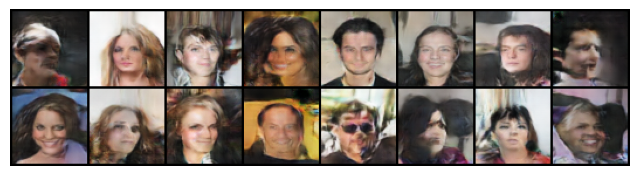

Epoch [17/50] Batch 0/1583 | D Loss: 0.0788 | G Loss: 4.9319
Epoch [17/50] Batch 100/1583 | D Loss: 0.3032 | G Loss: 2.2267
Epoch [17/50] Batch 200/1583 | D Loss: 0.6260 | G Loss: 2.7465
Epoch [17/50] Batch 300/1583 | D Loss: 0.1880 | G Loss: 4.8382
Epoch [17/50] Batch 400/1583 | D Loss: 0.1010 | G Loss: 4.3721
Epoch [17/50] Batch 500/1583 | D Loss: 0.0692 | G Loss: 3.9928
Epoch [17/50] Batch 600/1583 | D Loss: 0.0202 | G Loss: 5.6739
Epoch [17/50] Batch 700/1583 | D Loss: 0.0241 | G Loss: 5.2327
Epoch [17/50] Batch 800/1583 | D Loss: 0.2165 | G Loss: 5.8060
Epoch [17/50] Batch 900/1583 | D Loss: 0.0783 | G Loss: 4.2906
Epoch [17/50] Batch 1000/1583 | D Loss: 0.2253 | G Loss: 4.5364
Epoch [17/50] Batch 1100/1583 | D Loss: 0.0653 | G Loss: 5.6213
Epoch [17/50] Batch 1200/1583 | D Loss: 0.2797 | G Loss: 3.4784
Epoch [17/50] Batch 1300/1583 | D Loss: 0.0646 | G Loss: 4.3137
Epoch [17/50] Batch 1400/1583 | D Loss: 0.1191 | G Loss: 6.9023
Epoch [17/50] Batch 1500/1583 | D Loss: 0.0490 | G L

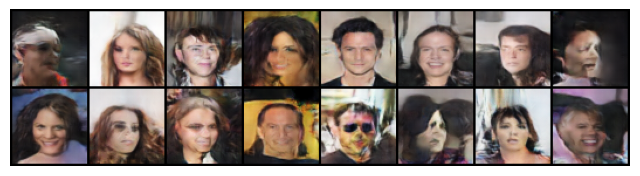

Epoch [18/50] Batch 0/1583 | D Loss: 0.2846 | G Loss: 3.7420
Epoch [18/50] Batch 100/1583 | D Loss: 0.0603 | G Loss: 5.0760
Epoch [18/50] Batch 200/1583 | D Loss: 0.0376 | G Loss: 6.0792
Epoch [18/50] Batch 300/1583 | D Loss: 0.0138 | G Loss: 6.3017
Epoch [18/50] Batch 400/1583 | D Loss: 0.2401 | G Loss: 2.6547
Epoch [18/50] Batch 500/1583 | D Loss: 0.4463 | G Loss: 2.5678
Epoch [18/50] Batch 600/1583 | D Loss: 0.0642 | G Loss: 4.9751
Epoch [18/50] Batch 700/1583 | D Loss: 0.0639 | G Loss: 5.3450
Epoch [18/50] Batch 800/1583 | D Loss: 0.0199 | G Loss: 5.8245
Epoch [18/50] Batch 900/1583 | D Loss: 0.0862 | G Loss: 5.6149
Epoch [18/50] Batch 1000/1583 | D Loss: 0.0473 | G Loss: 5.7280
Epoch [18/50] Batch 1100/1583 | D Loss: 0.2035 | G Loss: 3.3784
Epoch [18/50] Batch 1200/1583 | D Loss: 0.1283 | G Loss: 6.6561
Epoch [18/50] Batch 1300/1583 | D Loss: 0.2791 | G Loss: 3.6923
Epoch [18/50] Batch 1400/1583 | D Loss: 1.5365 | G Loss: 13.1389
Epoch [18/50] Batch 1500/1583 | D Loss: 0.1188 | G 

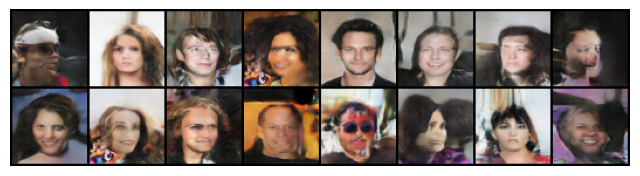

Epoch [19/50] Batch 0/1583 | D Loss: 0.0572 | G Loss: 3.7260
Epoch [19/50] Batch 100/1583 | D Loss: 0.0356 | G Loss: 5.2369
Epoch [19/50] Batch 200/1583 | D Loss: 0.0986 | G Loss: 4.3738
Epoch [19/50] Batch 300/1583 | D Loss: 0.0721 | G Loss: 4.6676
Epoch [19/50] Batch 400/1583 | D Loss: 0.3318 | G Loss: 3.3136
Epoch [19/50] Batch 500/1583 | D Loss: 0.0294 | G Loss: 5.7908
Epoch [19/50] Batch 600/1583 | D Loss: 0.1050 | G Loss: 4.0824
Epoch [19/50] Batch 700/1583 | D Loss: 0.0343 | G Loss: 4.8508
Epoch [19/50] Batch 800/1583 | D Loss: 0.0270 | G Loss: 5.5479
Epoch [19/50] Batch 900/1583 | D Loss: 0.1330 | G Loss: 6.0965
Epoch [19/50] Batch 1000/1583 | D Loss: 0.5833 | G Loss: 5.7140
Epoch [19/50] Batch 1100/1583 | D Loss: 0.0186 | G Loss: 6.3888
Epoch [19/50] Batch 1200/1583 | D Loss: 0.1127 | G Loss: 6.7235
Epoch [19/50] Batch 1300/1583 | D Loss: 0.0195 | G Loss: 5.7686
Epoch [19/50] Batch 1400/1583 | D Loss: 0.0553 | G Loss: 5.0052
Epoch [19/50] Batch 1500/1583 | D Loss: 0.1272 | G L

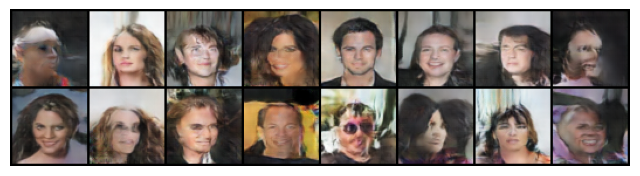

Epoch [20/50] Batch 0/1583 | D Loss: 0.0711 | G Loss: 5.1400
Epoch [20/50] Batch 100/1583 | D Loss: 0.2341 | G Loss: 4.8912
Epoch [20/50] Batch 200/1583 | D Loss: 0.2586 | G Loss: 4.2629
Epoch [20/50] Batch 300/1583 | D Loss: 0.0396 | G Loss: 6.8166
Epoch [20/50] Batch 400/1583 | D Loss: 0.1120 | G Loss: 5.2172
Epoch [20/50] Batch 500/1583 | D Loss: 0.8945 | G Loss: 0.6120
Epoch [20/50] Batch 600/1583 | D Loss: 0.1438 | G Loss: 3.9721
Epoch [20/50] Batch 700/1583 | D Loss: 0.1142 | G Loss: 3.8875
Epoch [20/50] Batch 800/1583 | D Loss: 0.1379 | G Loss: 4.6174
Epoch [20/50] Batch 900/1583 | D Loss: 0.0401 | G Loss: 5.2097
Epoch [20/50] Batch 1000/1583 | D Loss: 0.1163 | G Loss: 5.4447
Epoch [20/50] Batch 1100/1583 | D Loss: 0.1297 | G Loss: 3.8809
Epoch [20/50] Batch 1200/1583 | D Loss: 0.0528 | G Loss: 5.0443
Epoch [20/50] Batch 1300/1583 | D Loss: 0.0242 | G Loss: 6.5688
Epoch [20/50] Batch 1400/1583 | D Loss: 0.0541 | G Loss: 6.1744
Epoch [20/50] Batch 1500/1583 | D Loss: 0.8311 | G L

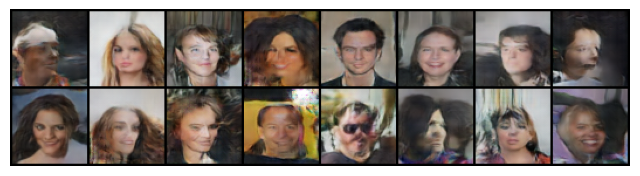

Epoch [21/50] Batch 0/1583 | D Loss: 0.0863 | G Loss: 5.1153
Epoch [21/50] Batch 100/1583 | D Loss: 0.0622 | G Loss: 5.8297
Epoch [21/50] Batch 200/1583 | D Loss: 0.0669 | G Loss: 4.6447
Epoch [21/50] Batch 300/1583 | D Loss: 0.0892 | G Loss: 5.6635
Epoch [21/50] Batch 400/1583 | D Loss: 0.0465 | G Loss: 5.4866
Epoch [21/50] Batch 500/1583 | D Loss: 0.0418 | G Loss: 5.7559
Epoch [21/50] Batch 600/1583 | D Loss: 0.1275 | G Loss: 3.7715
Epoch [21/50] Batch 700/1583 | D Loss: 0.0702 | G Loss: 4.5080
Epoch [21/50] Batch 800/1583 | D Loss: 0.3027 | G Loss: 4.1654
Epoch [21/50] Batch 900/1583 | D Loss: 0.2553 | G Loss: 6.5167
Epoch [21/50] Batch 1000/1583 | D Loss: 0.0334 | G Loss: 5.5014
Epoch [21/50] Batch 1100/1583 | D Loss: 0.0753 | G Loss: 4.6155
Epoch [21/50] Batch 1200/1583 | D Loss: 0.0782 | G Loss: 4.1730
Epoch [21/50] Batch 1300/1583 | D Loss: 2.8807 | G Loss: 15.7057
Epoch [21/50] Batch 1400/1583 | D Loss: 0.0999 | G Loss: 7.3307
Epoch [21/50] Batch 1500/1583 | D Loss: 0.1337 | G 

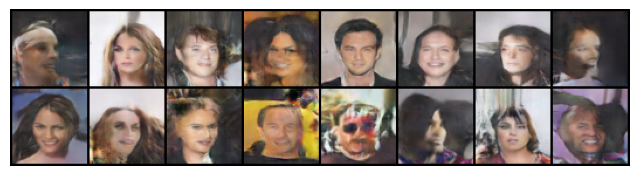

Epoch [22/50] Batch 0/1583 | D Loss: 0.0422 | G Loss: 5.8372
Epoch [22/50] Batch 100/1583 | D Loss: 0.1143 | G Loss: 3.8585
Epoch [22/50] Batch 200/1583 | D Loss: 0.0266 | G Loss: 5.4551
Epoch [22/50] Batch 300/1583 | D Loss: 0.0512 | G Loss: 5.0231
Epoch [22/50] Batch 400/1583 | D Loss: 0.0736 | G Loss: 5.1282
Epoch [22/50] Batch 500/1583 | D Loss: 0.0441 | G Loss: 4.9044
Epoch [22/50] Batch 600/1583 | D Loss: 0.3006 | G Loss: 2.7117
Epoch [22/50] Batch 700/1583 | D Loss: 0.1059 | G Loss: 5.9549
Epoch [22/50] Batch 800/1583 | D Loss: 0.0926 | G Loss: 5.0762
Epoch [22/50] Batch 900/1583 | D Loss: 0.4021 | G Loss: 1.4828
Epoch [22/50] Batch 1000/1583 | D Loss: 0.1089 | G Loss: 4.7241
Epoch [22/50] Batch 1100/1583 | D Loss: 0.0900 | G Loss: 4.7470
Epoch [22/50] Batch 1200/1583 | D Loss: 0.0268 | G Loss: 6.1443
Epoch [22/50] Batch 1300/1583 | D Loss: 0.3618 | G Loss: 3.9892
Epoch [22/50] Batch 1400/1583 | D Loss: 0.0954 | G Loss: 6.4184
Epoch [22/50] Batch 1500/1583 | D Loss: 0.0610 | G L

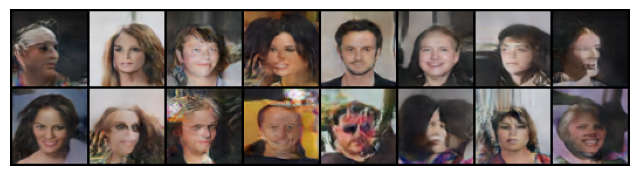

Epoch [23/50] Batch 0/1583 | D Loss: 0.0758 | G Loss: 3.8225
Epoch [23/50] Batch 100/1583 | D Loss: 0.0274 | G Loss: 6.0994
Epoch [23/50] Batch 200/1583 | D Loss: 0.0736 | G Loss: 5.3645
Epoch [23/50] Batch 300/1583 | D Loss: 0.0513 | G Loss: 5.2815
Epoch [23/50] Batch 400/1583 | D Loss: 0.2557 | G Loss: 4.1256
Epoch [23/50] Batch 500/1583 | D Loss: 0.0543 | G Loss: 5.4485
Epoch [23/50] Batch 600/1583 | D Loss: 0.0399 | G Loss: 5.4462
Epoch [23/50] Batch 700/1583 | D Loss: 0.0693 | G Loss: 5.9207
Epoch [23/50] Batch 800/1583 | D Loss: 0.2568 | G Loss: 3.4368
Epoch [23/50] Batch 900/1583 | D Loss: 0.0563 | G Loss: 5.0294
Epoch [23/50] Batch 1000/1583 | D Loss: 0.3701 | G Loss: 3.7125
Epoch [23/50] Batch 1100/1583 | D Loss: 0.1641 | G Loss: 7.5109
Epoch [23/50] Batch 1200/1583 | D Loss: 0.1056 | G Loss: 5.8620
Epoch [23/50] Batch 1300/1583 | D Loss: 0.0870 | G Loss: 4.9513
Epoch [23/50] Batch 1400/1583 | D Loss: 0.2723 | G Loss: 4.2222
Epoch [23/50] Batch 1500/1583 | D Loss: 0.3486 | G L

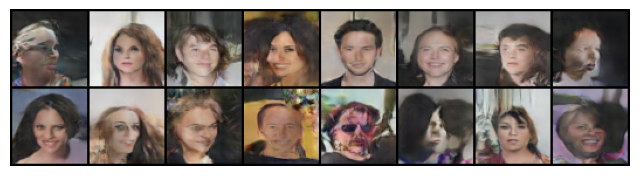

Epoch [24/50] Batch 0/1583 | D Loss: 0.3153 | G Loss: 3.1660
Epoch [24/50] Batch 100/1583 | D Loss: 0.0535 | G Loss: 6.8874
Epoch [24/50] Batch 200/1583 | D Loss: 0.0760 | G Loss: 3.9836
Epoch [24/50] Batch 300/1583 | D Loss: 0.0879 | G Loss: 6.4351
Epoch [24/50] Batch 400/1583 | D Loss: 0.2845 | G Loss: 4.3861
Epoch [24/50] Batch 500/1583 | D Loss: 0.0889 | G Loss: 4.7692
Epoch [24/50] Batch 600/1583 | D Loss: 0.0206 | G Loss: 5.4650
Epoch [24/50] Batch 700/1583 | D Loss: 0.0520 | G Loss: 4.8178
Epoch [24/50] Batch 800/1583 | D Loss: 0.4260 | G Loss: 4.7182
Epoch [24/50] Batch 900/1583 | D Loss: 0.0485 | G Loss: 6.1618
Epoch [24/50] Batch 1000/1583 | D Loss: 0.0321 | G Loss: 5.0598
Epoch [24/50] Batch 1100/1583 | D Loss: 0.0392 | G Loss: 5.9428
Epoch [24/50] Batch 1200/1583 | D Loss: 0.0684 | G Loss: 4.5276
Epoch [24/50] Batch 1300/1583 | D Loss: 0.0182 | G Loss: 6.5093
Epoch [24/50] Batch 1400/1583 | D Loss: 0.3957 | G Loss: 2.5855
Epoch [24/50] Batch 1500/1583 | D Loss: 0.2918 | G L

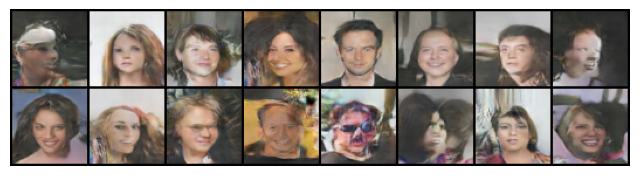

Epoch [25/50] Batch 0/1583 | D Loss: 0.0300 | G Loss: 5.1710
Epoch [25/50] Batch 100/1583 | D Loss: 0.1795 | G Loss: 7.0444
Epoch [25/50] Batch 200/1583 | D Loss: 0.0189 | G Loss: 6.1072
Epoch [25/50] Batch 300/1583 | D Loss: 0.1660 | G Loss: 3.7207
Epoch [25/50] Batch 400/1583 | D Loss: 0.3979 | G Loss: 3.0989
Epoch [25/50] Batch 500/1583 | D Loss: 0.3220 | G Loss: 4.3255
Epoch [25/50] Batch 600/1583 | D Loss: 0.1727 | G Loss: 7.8526
Epoch [25/50] Batch 700/1583 | D Loss: 0.0835 | G Loss: 4.7092
Epoch [25/50] Batch 800/1583 | D Loss: 0.0687 | G Loss: 4.7626
Epoch [25/50] Batch 900/1583 | D Loss: 0.3985 | G Loss: 5.9998
Epoch [25/50] Batch 1000/1583 | D Loss: 0.0675 | G Loss: 4.8573
Epoch [25/50] Batch 1100/1583 | D Loss: 0.0401 | G Loss: 5.7593
Epoch [25/50] Batch 1200/1583 | D Loss: 0.2103 | G Loss: 3.4015
Epoch [25/50] Batch 1300/1583 | D Loss: 0.0638 | G Loss: 4.4278
Epoch [25/50] Batch 1400/1583 | D Loss: 0.0835 | G Loss: 4.4168
Epoch [25/50] Batch 1500/1583 | D Loss: 0.0428 | G L

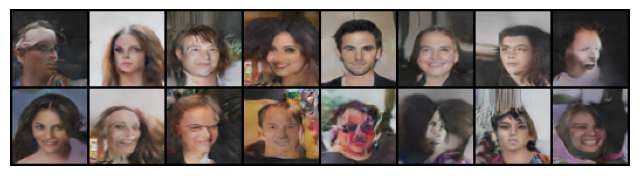

Epoch [26/50] Batch 0/1583 | D Loss: 5.1148 | G Loss: 1.4822
Epoch [26/50] Batch 100/1583 | D Loss: 0.1017 | G Loss: 4.4437
Epoch [26/50] Batch 200/1583 | D Loss: 0.0415 | G Loss: 5.6690
Epoch [26/50] Batch 300/1583 | D Loss: 0.0549 | G Loss: 5.4934
Epoch [26/50] Batch 400/1583 | D Loss: 0.0328 | G Loss: 5.2182
Epoch [26/50] Batch 500/1583 | D Loss: 0.2407 | G Loss: 3.5115
Epoch [26/50] Batch 600/1583 | D Loss: 0.2149 | G Loss: 3.3778
Epoch [26/50] Batch 700/1583 | D Loss: 0.0743 | G Loss: 5.2860
Epoch [26/50] Batch 800/1583 | D Loss: 0.0358 | G Loss: 5.4996
Epoch [26/50] Batch 900/1583 | D Loss: 0.0525 | G Loss: 5.9786
Epoch [26/50] Batch 1000/1583 | D Loss: 0.2404 | G Loss: 3.6787
Epoch [26/50] Batch 1100/1583 | D Loss: 0.0308 | G Loss: 6.1652
Epoch [26/50] Batch 1200/1583 | D Loss: 0.0173 | G Loss: 5.7631
Epoch [26/50] Batch 1300/1583 | D Loss: 0.1607 | G Loss: 4.6231
Epoch [26/50] Batch 1400/1583 | D Loss: 0.0351 | G Loss: 5.1031
Epoch [26/50] Batch 1500/1583 | D Loss: 2.0257 | G L

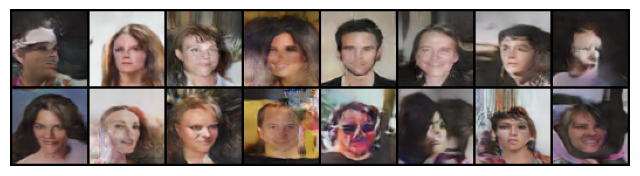

Epoch [27/50] Batch 0/1583 | D Loss: 0.0334 | G Loss: 6.0660
Epoch [27/50] Batch 100/1583 | D Loss: 0.4749 | G Loss: 3.0924
Epoch [27/50] Batch 200/1583 | D Loss: 0.0347 | G Loss: 6.2265
Epoch [27/50] Batch 300/1583 | D Loss: 0.0506 | G Loss: 5.7354
Epoch [27/50] Batch 400/1583 | D Loss: 0.0961 | G Loss: 5.7423
Epoch [27/50] Batch 500/1583 | D Loss: 0.0411 | G Loss: 5.2203
Epoch [27/50] Batch 600/1583 | D Loss: 0.0604 | G Loss: 5.9932
Epoch [27/50] Batch 700/1583 | D Loss: 0.0684 | G Loss: 4.8704
Epoch [27/50] Batch 800/1583 | D Loss: 0.0451 | G Loss: 6.0282
Epoch [27/50] Batch 900/1583 | D Loss: 0.0395 | G Loss: 6.3763
Epoch [27/50] Batch 1000/1583 | D Loss: 0.0321 | G Loss: 5.7464
Epoch [27/50] Batch 1100/1583 | D Loss: 0.0540 | G Loss: 5.0843
Epoch [27/50] Batch 1200/1583 | D Loss: 0.0957 | G Loss: 6.5827
Epoch [27/50] Batch 1300/1583 | D Loss: 0.1046 | G Loss: 4.5903
Epoch [27/50] Batch 1400/1583 | D Loss: 0.0818 | G Loss: 4.9117
Epoch [27/50] Batch 1500/1583 | D Loss: 0.1556 | G L

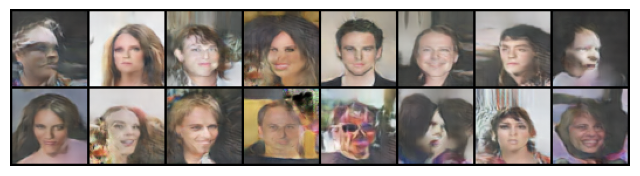

Epoch [28/50] Batch 0/1583 | D Loss: 0.0205 | G Loss: 6.4280
Epoch [28/50] Batch 100/1583 | D Loss: 0.1683 | G Loss: 5.5074
Epoch [28/50] Batch 200/1583 | D Loss: 0.0234 | G Loss: 6.7903
Epoch [28/50] Batch 300/1583 | D Loss: 0.0549 | G Loss: 5.1819
Epoch [28/50] Batch 400/1583 | D Loss: 0.0265 | G Loss: 7.1562
Epoch [28/50] Batch 500/1583 | D Loss: 0.2883 | G Loss: 5.3229
Epoch [28/50] Batch 600/1583 | D Loss: 0.0470 | G Loss: 5.9095
Epoch [28/50] Batch 700/1583 | D Loss: 0.1132 | G Loss: 3.4196
Epoch [28/50] Batch 800/1583 | D Loss: 0.0184 | G Loss: 6.5231
Epoch [28/50] Batch 900/1583 | D Loss: 0.0563 | G Loss: 4.8346
Epoch [28/50] Batch 1000/1583 | D Loss: 0.0709 | G Loss: 5.9647
Epoch [28/50] Batch 1100/1583 | D Loss: 0.0678 | G Loss: 5.0498
Epoch [28/50] Batch 1200/1583 | D Loss: 0.0827 | G Loss: 4.0560
Epoch [28/50] Batch 1300/1583 | D Loss: 0.1456 | G Loss: 8.2846
Epoch [28/50] Batch 1400/1583 | D Loss: 0.3326 | G Loss: 3.5633
Epoch [28/50] Batch 1500/1583 | D Loss: 0.0505 | G L

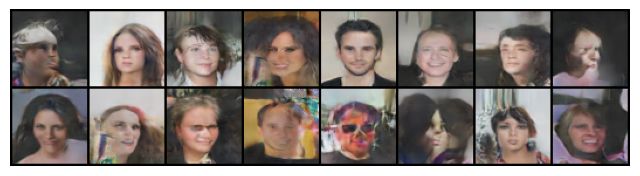

Epoch [29/50] Batch 0/1583 | D Loss: 0.0539 | G Loss: 5.8486
Epoch [29/50] Batch 100/1583 | D Loss: 0.0419 | G Loss: 5.8781
Epoch [29/50] Batch 200/1583 | D Loss: 0.1967 | G Loss: 4.2546
Epoch [29/50] Batch 300/1583 | D Loss: 0.0521 | G Loss: 5.1895
Epoch [29/50] Batch 400/1583 | D Loss: 0.0918 | G Loss: 4.1094
Epoch [29/50] Batch 500/1583 | D Loss: 0.0376 | G Loss: 4.9833
Epoch [29/50] Batch 600/1583 | D Loss: 0.0824 | G Loss: 5.2688
Epoch [29/50] Batch 700/1583 | D Loss: 0.0320 | G Loss: 5.6941
Epoch [29/50] Batch 800/1583 | D Loss: 0.1250 | G Loss: 4.7516
Epoch [29/50] Batch 900/1583 | D Loss: 0.5903 | G Loss: 1.9735
Epoch [29/50] Batch 1000/1583 | D Loss: 0.0440 | G Loss: 5.1402
Epoch [29/50] Batch 1100/1583 | D Loss: 0.0384 | G Loss: 5.4029
Epoch [29/50] Batch 1200/1583 | D Loss: 0.0690 | G Loss: 5.9215
Epoch [29/50] Batch 1300/1583 | D Loss: 0.0493 | G Loss: 5.2393
Epoch [29/50] Batch 1400/1583 | D Loss: 0.0209 | G Loss: 5.1901
Epoch [29/50] Batch 1500/1583 | D Loss: 0.0470 | G L

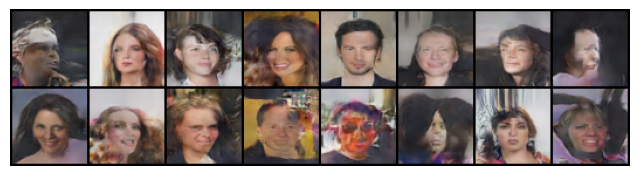

Epoch [30/50] Batch 0/1583 | D Loss: 0.0576 | G Loss: 4.7157
Epoch [30/50] Batch 100/1583 | D Loss: 3.0005 | G Loss: 1.0112
Epoch [30/50] Batch 200/1583 | D Loss: 0.1332 | G Loss: 3.1656
Epoch [30/50] Batch 300/1583 | D Loss: 0.0947 | G Loss: 6.4383
Epoch [30/50] Batch 400/1583 | D Loss: 0.1529 | G Loss: 6.9559
Epoch [30/50] Batch 500/1583 | D Loss: 0.1022 | G Loss: 4.2890
Epoch [30/50] Batch 600/1583 | D Loss: 0.0574 | G Loss: 5.9206
Epoch [30/50] Batch 700/1583 | D Loss: 0.0457 | G Loss: 5.5817
Epoch [30/50] Batch 800/1583 | D Loss: 5.4611 | G Loss: 0.0251
Epoch [30/50] Batch 900/1583 | D Loss: 0.0378 | G Loss: 5.4872
Epoch [30/50] Batch 1000/1583 | D Loss: 0.9010 | G Loss: 2.6235
Epoch [30/50] Batch 1100/1583 | D Loss: 0.1068 | G Loss: 5.1602
Epoch [30/50] Batch 1200/1583 | D Loss: 0.3964 | G Loss: 3.3442
Epoch [30/50] Batch 1300/1583 | D Loss: 0.1117 | G Loss: 4.6617
Epoch [30/50] Batch 1400/1583 | D Loss: 0.0976 | G Loss: 4.7439
Epoch [30/50] Batch 1500/1583 | D Loss: 0.0325 | G L

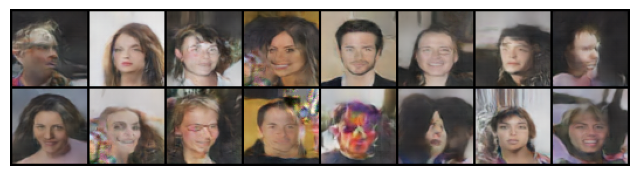

Epoch [31/50] Batch 0/1583 | D Loss: 0.1631 | G Loss: 5.5224
Epoch [31/50] Batch 100/1583 | D Loss: 0.0313 | G Loss: 5.0074
Epoch [31/50] Batch 200/1583 | D Loss: 0.0543 | G Loss: 5.4291
Epoch [31/50] Batch 300/1583 | D Loss: 0.0342 | G Loss: 5.5801
Epoch [31/50] Batch 400/1583 | D Loss: 0.2185 | G Loss: 3.4405
Epoch [31/50] Batch 500/1583 | D Loss: 0.1636 | G Loss: 3.9760
Epoch [31/50] Batch 600/1583 | D Loss: 0.2390 | G Loss: 5.5574
Epoch [31/50] Batch 700/1583 | D Loss: 0.0506 | G Loss: 5.9329
Epoch [31/50] Batch 800/1583 | D Loss: 0.0823 | G Loss: 6.6447
Epoch [31/50] Batch 900/1583 | D Loss: 0.0450 | G Loss: 5.1496
Epoch [31/50] Batch 1000/1583 | D Loss: 0.0364 | G Loss: 5.4755
Epoch [31/50] Batch 1100/1583 | D Loss: 0.1852 | G Loss: 3.7518
Epoch [31/50] Batch 1200/1583 | D Loss: 0.1210 | G Loss: 4.2079
Epoch [31/50] Batch 1300/1583 | D Loss: 0.0783 | G Loss: 6.4776
Epoch [31/50] Batch 1400/1583 | D Loss: 0.0223 | G Loss: 7.0757
Epoch [31/50] Batch 1500/1583 | D Loss: 0.1135 | G L

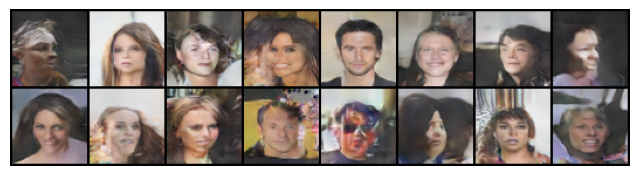

Epoch [32/50] Batch 0/1583 | D Loss: 0.0895 | G Loss: 4.4010
Epoch [32/50] Batch 100/1583 | D Loss: 0.0303 | G Loss: 5.7453
Epoch [32/50] Batch 200/1583 | D Loss: 7.7606 | G Loss: 0.6529
Epoch [32/50] Batch 300/1583 | D Loss: 0.2333 | G Loss: 5.8057
Epoch [32/50] Batch 400/1583 | D Loss: 0.0859 | G Loss: 5.1384
Epoch [32/50] Batch 500/1583 | D Loss: 0.0872 | G Loss: 5.7010
Epoch [32/50] Batch 600/1583 | D Loss: 0.0548 | G Loss: 5.0664
Epoch [32/50] Batch 700/1583 | D Loss: 0.0680 | G Loss: 4.8123
Epoch [32/50] Batch 800/1583 | D Loss: 0.0336 | G Loss: 5.6543
Epoch [32/50] Batch 900/1583 | D Loss: 0.0402 | G Loss: 6.7379
Epoch [32/50] Batch 1000/1583 | D Loss: 0.0609 | G Loss: 4.9387
Epoch [32/50] Batch 1100/1583 | D Loss: 0.0584 | G Loss: 4.6883
Epoch [32/50] Batch 1200/1583 | D Loss: 0.0314 | G Loss: 6.1258
Epoch [32/50] Batch 1300/1583 | D Loss: 0.0916 | G Loss: 4.8166
Epoch [32/50] Batch 1400/1583 | D Loss: 1.3672 | G Loss: 0.0138
Epoch [32/50] Batch 1500/1583 | D Loss: 0.0822 | G L

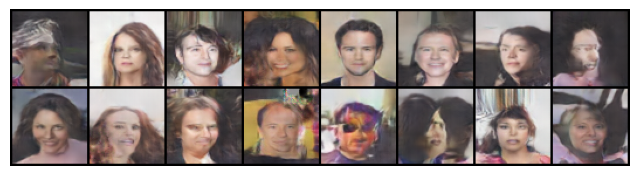

Epoch [33/50] Batch 0/1583 | D Loss: 0.0591 | G Loss: 5.5163
Epoch [33/50] Batch 100/1583 | D Loss: 0.0423 | G Loss: 4.9906
Epoch [33/50] Batch 200/1583 | D Loss: 0.0469 | G Loss: 5.7923
Epoch [33/50] Batch 300/1583 | D Loss: 0.0354 | G Loss: 5.8047
Epoch [33/50] Batch 400/1583 | D Loss: 0.1705 | G Loss: 4.9164
Epoch [33/50] Batch 500/1583 | D Loss: 0.0589 | G Loss: 5.4936
Epoch [33/50] Batch 600/1583 | D Loss: 0.0229 | G Loss: 5.9159
Epoch [33/50] Batch 700/1583 | D Loss: 0.0374 | G Loss: 6.0593
Epoch [33/50] Batch 800/1583 | D Loss: 0.0929 | G Loss: 4.5966
Epoch [33/50] Batch 900/1583 | D Loss: 0.0130 | G Loss: 5.9888
Epoch [33/50] Batch 1000/1583 | D Loss: 0.0252 | G Loss: 6.6054
Epoch [33/50] Batch 1100/1583 | D Loss: 0.1179 | G Loss: 5.3066
Epoch [33/50] Batch 1200/1583 | D Loss: 0.1754 | G Loss: 6.2845
Epoch [33/50] Batch 1300/1583 | D Loss: 0.1129 | G Loss: 7.0179
Epoch [33/50] Batch 1400/1583 | D Loss: 0.3200 | G Loss: 2.2336
Epoch [33/50] Batch 1500/1583 | D Loss: 0.0476 | G L

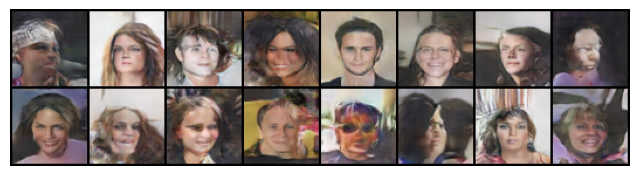

Epoch [34/50] Batch 0/1583 | D Loss: 0.0408 | G Loss: 5.6194
Epoch [34/50] Batch 100/1583 | D Loss: 0.3964 | G Loss: 3.5101
Epoch [34/50] Batch 200/1583 | D Loss: 0.0415 | G Loss: 5.3598
Epoch [34/50] Batch 300/1583 | D Loss: 0.0567 | G Loss: 5.1342
Epoch [34/50] Batch 400/1583 | D Loss: 0.0673 | G Loss: 4.9052
Epoch [34/50] Batch 500/1583 | D Loss: 0.0789 | G Loss: 4.7744
Epoch [34/50] Batch 600/1583 | D Loss: 0.0644 | G Loss: 5.0955
Epoch [34/50] Batch 700/1583 | D Loss: 0.0255 | G Loss: 5.2932
Epoch [34/50] Batch 800/1583 | D Loss: 0.2935 | G Loss: 2.3325
Epoch [34/50] Batch 900/1583 | D Loss: 0.0635 | G Loss: 6.0313
Epoch [34/50] Batch 1000/1583 | D Loss: 0.0256 | G Loss: 6.1328
Epoch [34/50] Batch 1100/1583 | D Loss: 1.1622 | G Loss: 4.4814
Epoch [34/50] Batch 1200/1583 | D Loss: 0.1153 | G Loss: 3.8867
Epoch [34/50] Batch 1300/1583 | D Loss: 0.0391 | G Loss: 5.0063
Epoch [34/50] Batch 1400/1583 | D Loss: 0.0363 | G Loss: 5.5270
Epoch [34/50] Batch 1500/1583 | D Loss: 0.0333 | G L

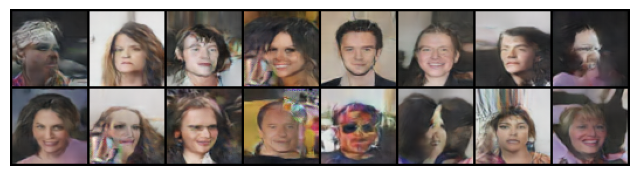

Epoch [35/50] Batch 0/1583 | D Loss: 0.0597 | G Loss: 5.2967
Epoch [35/50] Batch 100/1583 | D Loss: 0.3690 | G Loss: 3.1041
Epoch [35/50] Batch 200/1583 | D Loss: 0.0699 | G Loss: 4.8900
Epoch [35/50] Batch 300/1583 | D Loss: 0.0773 | G Loss: 6.0004
Epoch [35/50] Batch 400/1583 | D Loss: 0.6582 | G Loss: 1.9311
Epoch [35/50] Batch 500/1583 | D Loss: 0.2138 | G Loss: 5.8932
Epoch [35/50] Batch 600/1583 | D Loss: 0.0396 | G Loss: 4.9768
Epoch [35/50] Batch 700/1583 | D Loss: 0.0400 | G Loss: 6.0895
Epoch [35/50] Batch 800/1583 | D Loss: 0.0263 | G Loss: 5.5320
Epoch [35/50] Batch 900/1583 | D Loss: 0.0515 | G Loss: 5.1894
Epoch [35/50] Batch 1000/1583 | D Loss: 0.0434 | G Loss: 5.9063
Epoch [35/50] Batch 1100/1583 | D Loss: 0.2127 | G Loss: 4.2349
Epoch [35/50] Batch 1200/1583 | D Loss: 0.0709 | G Loss: 4.0791
Epoch [35/50] Batch 1300/1583 | D Loss: 0.0108 | G Loss: 6.5093
Epoch [35/50] Batch 1400/1583 | D Loss: 0.0864 | G Loss: 4.8662
Epoch [35/50] Batch 1500/1583 | D Loss: 0.0270 | G L

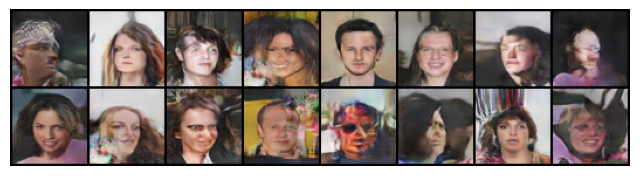

Epoch [36/50] Batch 0/1583 | D Loss: 0.0326 | G Loss: 5.7195
Epoch [36/50] Batch 100/1583 | D Loss: 0.5381 | G Loss: 3.1083
Epoch [36/50] Batch 200/1583 | D Loss: 0.0285 | G Loss: 5.5865
Epoch [36/50] Batch 300/1583 | D Loss: 0.0296 | G Loss: 5.8834
Epoch [36/50] Batch 400/1583 | D Loss: 0.0212 | G Loss: 6.0952
Epoch [36/50] Batch 500/1583 | D Loss: 0.0569 | G Loss: 5.3775
Epoch [36/50] Batch 600/1583 | D Loss: 0.3416 | G Loss: 3.3853
Epoch [36/50] Batch 700/1583 | D Loss: 0.0386 | G Loss: 5.2121
Epoch [36/50] Batch 800/1583 | D Loss: 0.1656 | G Loss: 2.6690
Epoch [36/50] Batch 900/1583 | D Loss: 0.0158 | G Loss: 6.1412
Epoch [36/50] Batch 1000/1583 | D Loss: 0.0243 | G Loss: 5.5666
Epoch [36/50] Batch 1100/1583 | D Loss: 0.3903 | G Loss: 4.5123
Epoch [36/50] Batch 1200/1583 | D Loss: 0.0358 | G Loss: 5.8517
Epoch [36/50] Batch 1300/1583 | D Loss: 0.1349 | G Loss: 6.6721
Epoch [36/50] Batch 1400/1583 | D Loss: 6.9450 | G Loss: 16.9060
Epoch [36/50] Batch 1500/1583 | D Loss: 0.3133 | G 

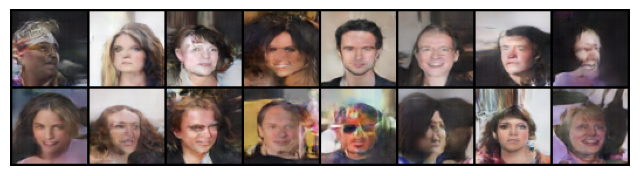

Epoch [37/50] Batch 0/1583 | D Loss: 0.2420 | G Loss: 4.2002
Epoch [37/50] Batch 100/1583 | D Loss: 0.1725 | G Loss: 4.2232
Epoch [37/50] Batch 200/1583 | D Loss: 0.0388 | G Loss: 6.7382
Epoch [37/50] Batch 300/1583 | D Loss: 0.0235 | G Loss: 5.9630
Epoch [37/50] Batch 400/1583 | D Loss: 0.0467 | G Loss: 5.8092
Epoch [37/50] Batch 500/1583 | D Loss: 0.0470 | G Loss: 5.1697
Epoch [37/50] Batch 600/1583 | D Loss: 0.3565 | G Loss: 3.1321
Epoch [37/50] Batch 700/1583 | D Loss: 0.0408 | G Loss: 5.3926
Epoch [37/50] Batch 800/1583 | D Loss: 0.0952 | G Loss: 4.0426
Epoch [37/50] Batch 900/1583 | D Loss: 0.0504 | G Loss: 5.9781
Epoch [37/50] Batch 1000/1583 | D Loss: 0.0500 | G Loss: 6.5467
Epoch [37/50] Batch 1100/1583 | D Loss: 0.1219 | G Loss: 6.8004
Epoch [37/50] Batch 1200/1583 | D Loss: 0.0194 | G Loss: 5.9307
Epoch [37/50] Batch 1300/1583 | D Loss: 0.0337 | G Loss: 6.7049
Epoch [37/50] Batch 1400/1583 | D Loss: 0.0749 | G Loss: 5.5778
Epoch [37/50] Batch 1500/1583 | D Loss: 0.1130 | G L

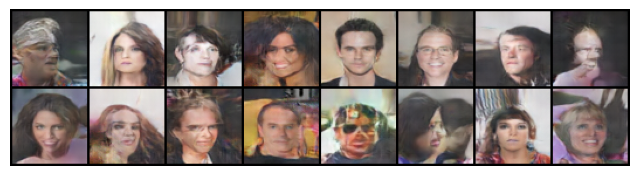

Epoch [38/50] Batch 0/1583 | D Loss: 0.0465 | G Loss: 5.9733
Epoch [38/50] Batch 100/1583 | D Loss: 0.0500 | G Loss: 5.6186
Epoch [38/50] Batch 200/1583 | D Loss: 0.2508 | G Loss: 11.4270
Epoch [38/50] Batch 300/1583 | D Loss: 0.0368 | G Loss: 5.6629
Epoch [38/50] Batch 400/1583 | D Loss: 0.0732 | G Loss: 4.7393
Epoch [38/50] Batch 500/1583 | D Loss: 0.1330 | G Loss: 4.0575
Epoch [38/50] Batch 600/1583 | D Loss: 0.0548 | G Loss: 5.5286
Epoch [38/50] Batch 700/1583 | D Loss: 0.3605 | G Loss: 4.0289
Epoch [38/50] Batch 800/1583 | D Loss: 0.1498 | G Loss: 3.5326
Epoch [38/50] Batch 900/1583 | D Loss: 0.0810 | G Loss: 6.3589
Epoch [38/50] Batch 1000/1583 | D Loss: 0.0403 | G Loss: 5.9988
Epoch [38/50] Batch 1100/1583 | D Loss: 0.0232 | G Loss: 6.1818
Epoch [38/50] Batch 1200/1583 | D Loss: 0.0364 | G Loss: 5.4427
Epoch [38/50] Batch 1300/1583 | D Loss: 0.0390 | G Loss: 5.9870
Epoch [38/50] Batch 1400/1583 | D Loss: 0.2642 | G Loss: 3.2065
Epoch [38/50] Batch 1500/1583 | D Loss: 0.0120 | G 

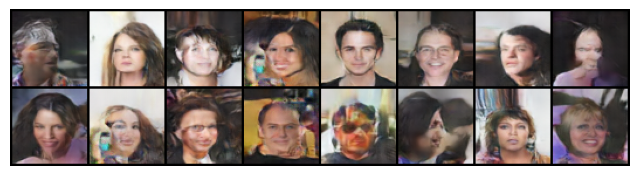

Epoch [39/50] Batch 0/1583 | D Loss: 0.0589 | G Loss: 6.3451
Epoch [39/50] Batch 100/1583 | D Loss: 0.0361 | G Loss: 5.8499
Epoch [39/50] Batch 200/1583 | D Loss: 3.1938 | G Loss: 0.2294
Epoch [39/50] Batch 300/1583 | D Loss: 0.0337 | G Loss: 5.5336
Epoch [39/50] Batch 400/1583 | D Loss: 0.1151 | G Loss: 3.3408
Epoch [39/50] Batch 500/1583 | D Loss: 0.0384 | G Loss: 5.7965
Epoch [39/50] Batch 600/1583 | D Loss: 0.2265 | G Loss: 4.2294
Epoch [39/50] Batch 700/1583 | D Loss: 0.0354 | G Loss: 6.0925
Epoch [39/50] Batch 800/1583 | D Loss: 0.0317 | G Loss: 6.2182
Epoch [39/50] Batch 900/1583 | D Loss: 0.0877 | G Loss: 6.1208
Epoch [39/50] Batch 1000/1583 | D Loss: 0.3833 | G Loss: 4.3560
Epoch [39/50] Batch 1100/1583 | D Loss: 0.2245 | G Loss: 3.9064
Epoch [39/50] Batch 1200/1583 | D Loss: 1.6752 | G Loss: 15.0564
Epoch [39/50] Batch 1300/1583 | D Loss: 0.0253 | G Loss: 5.8246
Epoch [39/50] Batch 1400/1583 | D Loss: 0.4770 | G Loss: 6.8359
Epoch [39/50] Batch 1500/1583 | D Loss: 0.0244 | G 

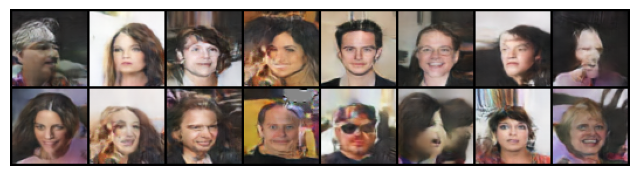

Epoch [40/50] Batch 0/1583 | D Loss: 0.0203 | G Loss: 6.7145
Epoch [40/50] Batch 100/1583 | D Loss: 5.5601 | G Loss: 13.4087
Epoch [40/50] Batch 200/1583 | D Loss: 0.0305 | G Loss: 5.9812
Epoch [40/50] Batch 300/1583 | D Loss: 0.0161 | G Loss: 7.0464
Epoch [40/50] Batch 400/1583 | D Loss: 0.0910 | G Loss: 4.6750
Epoch [40/50] Batch 500/1583 | D Loss: 0.1012 | G Loss: 6.0896
Epoch [40/50] Batch 600/1583 | D Loss: 0.0357 | G Loss: 5.8168
Epoch [40/50] Batch 700/1583 | D Loss: 0.0910 | G Loss: 7.6293
Epoch [40/50] Batch 800/1583 | D Loss: 0.0328 | G Loss: 4.9693
Epoch [40/50] Batch 900/1583 | D Loss: 0.1039 | G Loss: 7.6142
Epoch [40/50] Batch 1000/1583 | D Loss: 0.1674 | G Loss: 4.9930
Epoch [40/50] Batch 1100/1583 | D Loss: 0.0192 | G Loss: 6.2575
Epoch [40/50] Batch 1200/1583 | D Loss: 0.0393 | G Loss: 6.0914
Epoch [40/50] Batch 1300/1583 | D Loss: 0.1862 | G Loss: 4.8442
Epoch [40/50] Batch 1400/1583 | D Loss: 0.0724 | G Loss: 7.4665
Epoch [40/50] Batch 1500/1583 | D Loss: 0.1231 | G 

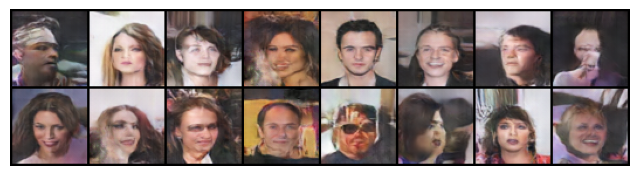

Epoch [41/50] Batch 0/1583 | D Loss: 0.2570 | G Loss: 3.4742
Epoch [41/50] Batch 100/1583 | D Loss: 0.0654 | G Loss: 6.3448
Epoch [41/50] Batch 200/1583 | D Loss: 0.0528 | G Loss: 6.5558
Epoch [41/50] Batch 300/1583 | D Loss: 0.0294 | G Loss: 5.7136
Epoch [41/50] Batch 400/1583 | D Loss: 1.5222 | G Loss: 4.0676
Epoch [41/50] Batch 500/1583 | D Loss: 0.0369 | G Loss: 5.9678
Epoch [41/50] Batch 600/1583 | D Loss: 0.0707 | G Loss: 6.0999
Epoch [41/50] Batch 700/1583 | D Loss: 0.1243 | G Loss: 5.2891
Epoch [41/50] Batch 800/1583 | D Loss: 0.1548 | G Loss: 4.7302
Epoch [41/50] Batch 900/1583 | D Loss: 0.0118 | G Loss: 6.5419
Epoch [41/50] Batch 1000/1583 | D Loss: 0.0810 | G Loss: 4.6876
Epoch [41/50] Batch 1100/1583 | D Loss: 0.0153 | G Loss: 8.1505
Epoch [41/50] Batch 1200/1583 | D Loss: 0.0282 | G Loss: 5.4807
Epoch [41/50] Batch 1300/1583 | D Loss: 0.1043 | G Loss: 6.5239
Epoch [41/50] Batch 1400/1583 | D Loss: 0.7504 | G Loss: 6.2259
Epoch [41/50] Batch 1500/1583 | D Loss: 0.1410 | G L

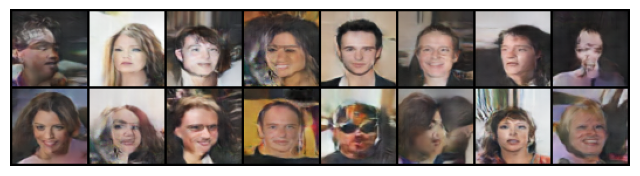

Epoch [42/50] Batch 0/1583 | D Loss: 0.0286 | G Loss: 5.4616
Epoch [42/50] Batch 100/1583 | D Loss: 0.0149 | G Loss: 7.3124
Epoch [42/50] Batch 200/1583 | D Loss: 0.0499 | G Loss: 5.4515
Epoch [42/50] Batch 300/1583 | D Loss: 0.1468 | G Loss: 3.9156
Epoch [42/50] Batch 400/1583 | D Loss: 4.6293 | G Loss: 0.1094
Epoch [42/50] Batch 500/1583 | D Loss: 0.1868 | G Loss: 4.1677
Epoch [42/50] Batch 600/1583 | D Loss: 0.0462 | G Loss: 5.7573
Epoch [42/50] Batch 700/1583 | D Loss: 0.0617 | G Loss: 5.1795
Epoch [42/50] Batch 800/1583 | D Loss: 0.0464 | G Loss: 5.3263
Epoch [42/50] Batch 900/1583 | D Loss: 0.0759 | G Loss: 7.2488
Epoch [42/50] Batch 1000/1583 | D Loss: 0.0259 | G Loss: 6.9389
Epoch [42/50] Batch 1100/1583 | D Loss: 0.0199 | G Loss: 6.3475
Epoch [42/50] Batch 1200/1583 | D Loss: 0.0728 | G Loss: 5.7655
Epoch [42/50] Batch 1300/1583 | D Loss: 0.0491 | G Loss: 6.5766
Epoch [42/50] Batch 1400/1583 | D Loss: 0.0398 | G Loss: 6.4729
Epoch [42/50] Batch 1500/1583 | D Loss: 0.0351 | G L

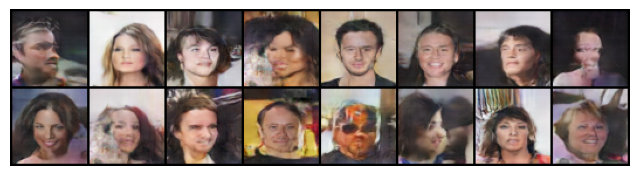

Epoch [43/50] Batch 0/1583 | D Loss: 0.0866 | G Loss: 5.9358
Epoch [43/50] Batch 100/1583 | D Loss: 0.1964 | G Loss: 4.9140
Epoch [43/50] Batch 200/1583 | D Loss: 0.1564 | G Loss: 3.8433
Epoch [43/50] Batch 300/1583 | D Loss: 0.0313 | G Loss: 5.3867
Epoch [43/50] Batch 400/1583 | D Loss: 0.0157 | G Loss: 8.3783
Epoch [43/50] Batch 500/1583 | D Loss: 0.0352 | G Loss: 5.7519
Epoch [43/50] Batch 600/1583 | D Loss: 0.1279 | G Loss: 4.7241
Epoch [43/50] Batch 700/1583 | D Loss: 0.0518 | G Loss: 5.7865
Epoch [43/50] Batch 800/1583 | D Loss: 0.1162 | G Loss: 5.5971
Epoch [43/50] Batch 900/1583 | D Loss: 0.6357 | G Loss: 6.5305
Epoch [43/50] Batch 1000/1583 | D Loss: 0.0248 | G Loss: 6.0742
Epoch [43/50] Batch 1100/1583 | D Loss: 0.0657 | G Loss: 5.5211
Epoch [43/50] Batch 1200/1583 | D Loss: 0.1435 | G Loss: 4.7081
Epoch [43/50] Batch 1300/1583 | D Loss: 0.3112 | G Loss: 6.0459
Epoch [43/50] Batch 1400/1583 | D Loss: 0.0239 | G Loss: 5.5617
Epoch [43/50] Batch 1500/1583 | D Loss: 0.0252 | G L

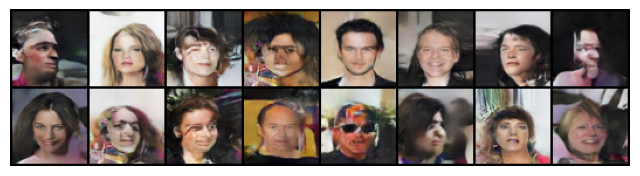

Epoch [44/50] Batch 0/1583 | D Loss: 1.3164 | G Loss: 0.3356
Epoch [44/50] Batch 100/1583 | D Loss: 0.0774 | G Loss: 4.8119
Epoch [44/50] Batch 200/1583 | D Loss: 0.0270 | G Loss: 6.3905
Epoch [44/50] Batch 300/1583 | D Loss: 0.1129 | G Loss: 4.1059
Epoch [44/50] Batch 400/1583 | D Loss: 0.0287 | G Loss: 5.8492
Epoch [44/50] Batch 500/1583 | D Loss: 0.3515 | G Loss: 5.7724
Epoch [44/50] Batch 600/1583 | D Loss: 0.0495 | G Loss: 5.4730
Epoch [44/50] Batch 700/1583 | D Loss: 0.0147 | G Loss: 6.3804
Epoch [44/50] Batch 800/1583 | D Loss: 0.1810 | G Loss: 6.1496
Epoch [44/50] Batch 900/1583 | D Loss: 0.0325 | G Loss: 6.0696
Epoch [44/50] Batch 1000/1583 | D Loss: 0.0802 | G Loss: 4.8622
Epoch [44/50] Batch 1100/1583 | D Loss: 2.0044 | G Loss: 2.3404
Epoch [44/50] Batch 1200/1583 | D Loss: 0.0690 | G Loss: 7.4553
Epoch [44/50] Batch 1300/1583 | D Loss: 0.1119 | G Loss: 4.0641
Epoch [44/50] Batch 1400/1583 | D Loss: 0.0692 | G Loss: 5.5138
Epoch [44/50] Batch 1500/1583 | D Loss: 0.0428 | G L

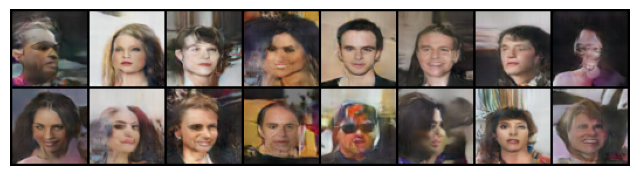

Epoch [45/50] Batch 0/1583 | D Loss: 0.1213 | G Loss: 4.1224
Epoch [45/50] Batch 100/1583 | D Loss: 0.0240 | G Loss: 5.6014
Epoch [45/50] Batch 200/1583 | D Loss: 0.3930 | G Loss: 6.5401
Epoch [45/50] Batch 300/1583 | D Loss: 0.0399 | G Loss: 5.9759
Epoch [45/50] Batch 400/1583 | D Loss: 0.0990 | G Loss: 5.6217
Epoch [45/50] Batch 500/1583 | D Loss: 0.0158 | G Loss: 6.7815
Epoch [45/50] Batch 600/1583 | D Loss: 0.0382 | G Loss: 5.6412
Epoch [45/50] Batch 700/1583 | D Loss: 0.0442 | G Loss: 6.7275
Epoch [45/50] Batch 800/1583 | D Loss: 0.2322 | G Loss: 5.4902
Epoch [45/50] Batch 900/1583 | D Loss: 0.0450 | G Loss: 5.7829
Epoch [45/50] Batch 1000/1583 | D Loss: 0.0776 | G Loss: 5.2288
Epoch [45/50] Batch 1100/1583 | D Loss: 0.0357 | G Loss: 6.2900
Epoch [45/50] Batch 1200/1583 | D Loss: 0.0624 | G Loss: 8.5738
Epoch [45/50] Batch 1300/1583 | D Loss: 0.1614 | G Loss: 4.2896
Epoch [45/50] Batch 1400/1583 | D Loss: 0.0338 | G Loss: 6.2951
Epoch [45/50] Batch 1500/1583 | D Loss: 0.0443 | G L

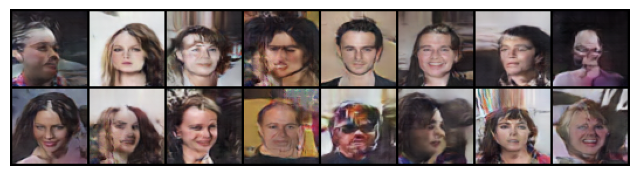

Epoch [46/50] Batch 0/1583 | D Loss: 0.0205 | G Loss: 6.6286
Epoch [46/50] Batch 100/1583 | D Loss: 0.0583 | G Loss: 6.3246
Epoch [46/50] Batch 200/1583 | D Loss: 0.0101 | G Loss: 6.6482
Epoch [46/50] Batch 300/1583 | D Loss: 0.0468 | G Loss: 5.5795
Epoch [46/50] Batch 400/1583 | D Loss: 0.0640 | G Loss: 6.5055
Epoch [46/50] Batch 500/1583 | D Loss: 0.0853 | G Loss: 4.1322
Epoch [46/50] Batch 600/1583 | D Loss: 0.0301 | G Loss: 6.6661
Epoch [46/50] Batch 700/1583 | D Loss: 0.0673 | G Loss: 5.1911
Epoch [46/50] Batch 800/1583 | D Loss: 0.0435 | G Loss: 5.3047
Epoch [46/50] Batch 900/1583 | D Loss: 0.0316 | G Loss: 6.1535
Epoch [46/50] Batch 1000/1583 | D Loss: 0.3119 | G Loss: 6.0004
Epoch [46/50] Batch 1100/1583 | D Loss: 0.0201 | G Loss: 6.8299
Epoch [46/50] Batch 1200/1583 | D Loss: 0.2973 | G Loss: 5.0767
Epoch [46/50] Batch 1300/1583 | D Loss: 0.0211 | G Loss: 5.7093
Epoch [46/50] Batch 1400/1583 | D Loss: 0.0270 | G Loss: 6.6877
Epoch [46/50] Batch 1500/1583 | D Loss: 0.0713 | G L

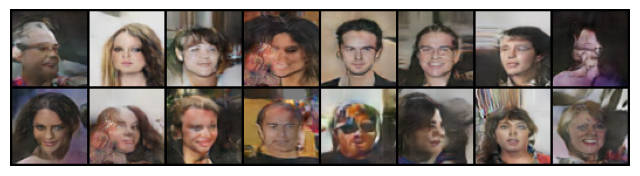

Epoch [47/50] Batch 0/1583 | D Loss: 0.0292 | G Loss: 6.0110
Epoch [47/50] Batch 100/1583 | D Loss: 0.0197 | G Loss: 6.8201
Epoch [47/50] Batch 200/1583 | D Loss: 0.0955 | G Loss: 6.7254
Epoch [47/50] Batch 300/1583 | D Loss: 1.2477 | G Loss: 1.2741
Epoch [47/50] Batch 400/1583 | D Loss: 0.0164 | G Loss: 7.1502
Epoch [47/50] Batch 500/1583 | D Loss: 0.1018 | G Loss: 4.6948
Epoch [47/50] Batch 600/1583 | D Loss: 0.0163 | G Loss: 6.6384
Epoch [47/50] Batch 700/1583 | D Loss: 0.0634 | G Loss: 5.0565
Epoch [47/50] Batch 800/1583 | D Loss: 0.0565 | G Loss: 5.2883
Epoch [47/50] Batch 900/1583 | D Loss: 0.0660 | G Loss: 5.7671
Epoch [47/50] Batch 1000/1583 | D Loss: 0.0412 | G Loss: 4.1780
Epoch [47/50] Batch 1100/1583 | D Loss: 0.0134 | G Loss: 6.7231
Epoch [47/50] Batch 1200/1583 | D Loss: 0.1549 | G Loss: 7.3112
Epoch [47/50] Batch 1300/1583 | D Loss: 0.0225 | G Loss: 5.8184
Epoch [47/50] Batch 1400/1583 | D Loss: 0.1579 | G Loss: 5.2954
Epoch [47/50] Batch 1500/1583 | D Loss: 0.4401 | G L

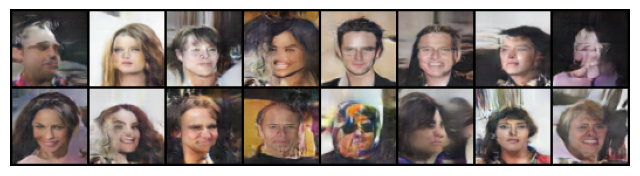

Epoch [48/50] Batch 0/1583 | D Loss: 0.0216 | G Loss: 6.3696
Epoch [48/50] Batch 100/1583 | D Loss: 0.1741 | G Loss: 4.2335
Epoch [48/50] Batch 200/1583 | D Loss: 0.0405 | G Loss: 5.2389
Epoch [48/50] Batch 300/1583 | D Loss: 0.9994 | G Loss: 3.2626
Epoch [48/50] Batch 400/1583 | D Loss: 0.3001 | G Loss: 5.7219
Epoch [48/50] Batch 500/1583 | D Loss: 0.0558 | G Loss: 6.1962
Epoch [48/50] Batch 600/1583 | D Loss: 0.0517 | G Loss: 6.7398
Epoch [48/50] Batch 700/1583 | D Loss: 0.0491 | G Loss: 5.5183
Epoch [48/50] Batch 800/1583 | D Loss: 0.0095 | G Loss: 7.3006
Epoch [48/50] Batch 900/1583 | D Loss: 0.0495 | G Loss: 5.6546
Epoch [48/50] Batch 1000/1583 | D Loss: 0.0125 | G Loss: 6.7563
Epoch [48/50] Batch 1100/1583 | D Loss: 0.0221 | G Loss: 6.5033
Epoch [48/50] Batch 1200/1583 | D Loss: 0.0440 | G Loss: 6.3030
Epoch [48/50] Batch 1300/1583 | D Loss: 0.2442 | G Loss: 5.9808
Epoch [48/50] Batch 1400/1583 | D Loss: 0.2469 | G Loss: 3.3009
Epoch [48/50] Batch 1500/1583 | D Loss: 0.0271 | G L

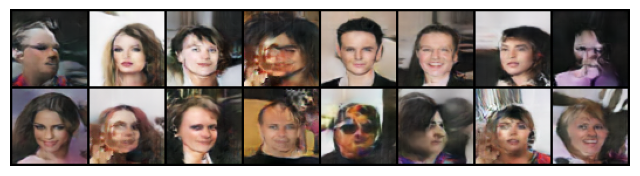

Epoch [49/50] Batch 0/1583 | D Loss: 0.0505 | G Loss: 4.7086
Epoch [49/50] Batch 100/1583 | D Loss: 0.0604 | G Loss: 5.2190
Epoch [49/50] Batch 200/1583 | D Loss: 0.1559 | G Loss: 5.2921
Epoch [49/50] Batch 300/1583 | D Loss: 0.0187 | G Loss: 6.5386
Epoch [49/50] Batch 400/1583 | D Loss: 0.1567 | G Loss: 4.2026
Epoch [49/50] Batch 500/1583 | D Loss: 0.0339 | G Loss: 5.8531
Epoch [49/50] Batch 600/1583 | D Loss: 0.0708 | G Loss: 5.4262
Epoch [49/50] Batch 700/1583 | D Loss: 0.1816 | G Loss: 9.0206
Epoch [49/50] Batch 800/1583 | D Loss: 0.2659 | G Loss: 4.1803
Epoch [49/50] Batch 900/1583 | D Loss: 0.0295 | G Loss: 5.8229
Epoch [49/50] Batch 1000/1583 | D Loss: 0.0372 | G Loss: 5.5503
Epoch [49/50] Batch 1100/1583 | D Loss: 0.1213 | G Loss: 4.8072
Epoch [49/50] Batch 1200/1583 | D Loss: 0.0206 | G Loss: 6.5212
Epoch [49/50] Batch 1300/1583 | D Loss: 0.0392 | G Loss: 6.0217
Epoch [49/50] Batch 1400/1583 | D Loss: 0.0139 | G Loss: 6.8582
Epoch [49/50] Batch 1500/1583 | D Loss: 0.0173 | G L

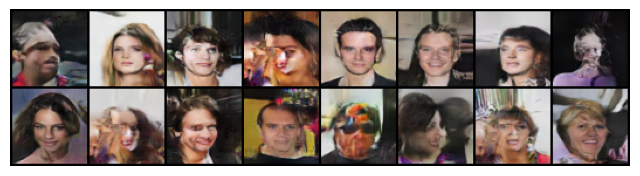

In [ ]:
import time
from tqdm import tqdm

# Number of epochs to train the GAN over
num_epochs = 50

for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(dataloader):
        # Training Discriminator
        netD.zero_grad() # Resetting gradients for Discriminator
        real_images = real_images.to(device)
        batch_size = real_images.size(0) # Getting batch size
        labels_real = torch.ones(batch_size, 1, device=device) # Creating labels for Real images 1
        labels_fake = torch.zeros(batch_size, 1, device=device) # Creating labels for Fake images 0

        output_real = netD(real_images).view(-1, 1)
        loss_real = criterion(output_real, labels_real)  # Comparing with real labels
        loss_real.backward() # Backpropagate gradients

        # Generating fake images using Generator
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake_images = netG(noise)
        output_fake = netD(fake_images.detach()).view(-1, 1) # Forward pass to compute Discriminator loss for fake images
        loss_fake = criterion(output_fake, labels_fake)
        loss_fake.backward()

        # Updating Discriminator weights
        optimizerD.step()

        # Training Generator
        netG.zero_grad() # Resetting gradients for Generator
        output_fake = netD(fake_images).view(-1, 1)  # Forward pass to get discriminator's prediction on fake images
        loss_G = criterion(output_fake, labels_real) # Generator tries to fool Discriminator
        loss_G.backward()

        # updating backpropagate gradients
        optimizerG.step()

        # Print progress
        if i % 100 == 0:
            print(f"Epoch [{epoch}/{num_epochs}] Batch {i}/{len(dataloader)} | D Loss: {loss_real+loss_fake:.4f} | G Loss: {loss_G:.4f}")

    # Save generated images
    with torch.no_grad():
        fake_images = netG(fixed_noise).detach().cpu()
    show_images(fake_images)


Each line in training represents one batch processed

# Fake image generated

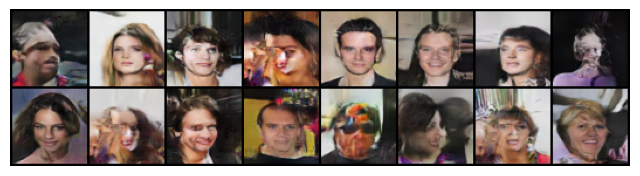

In [ ]:
with torch.no_grad():
    fake_images = netG(fixed_noise).detach().cpu()

show_images(fake_images)


# Committing to Github

In [1]:
!apt-get install git

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git is already the newest version (1:2.34.1-1ubuntu1.12).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


In [2]:
!git config --global user.name "TwiVyass"
!git config --global user.email "twvyass2346@gmail.com"

In [3]:
!git clone https://github.com/TwiVyass/GAN-Exp-3.git

Cloning into 'GAN-Exp-3'...


In [5]:
# Save the notebook from Colab to /content directory
from google.colab import files
files.download('Copy of GAN Lab_Experiment 3.ipynb')

FileNotFoundError: Cannot find file: Copy of GAN Lab_Experiment 3.ipynb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')